In [1]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-colorblind')    

import numpy as np
import datetime
import networkx as nx
import pandas as pd

from utils_graphs import *
from utils_data_vis import *

In [2]:
datasets_folder = "datasets/csvs/"
graphs_folder = "graphs/"
measures_folder = "measures/"
plots_folder = "plots/latex/"

# Horas críticas identificadas en el artículo de Beiró and Gandica et al.
HORA_CRITICA_NAT = "429624"
HORA_CRITICA_9N = "437037"
HORA_CRITICA_CH = "394717"
HORA_CRITICA_WD = "422369"

In [3]:
hour_window_nat = 1
hour_window_9n = 2
hour_window_ch = 2
hour_window_wd = 6

In [4]:
limites = True

In [5]:
# CH
# Hashtags como nodos
if limites:
    lim_ch_und = int(210/hour_window_ch)
    lim_ch_sup = int(337/hour_window_ch)
else:
    lim_ch_und = None
    lim_ch_sup = None

# WD
# Hashtags como nodos
if limites:
    lim_wd_und = int(180/hour_window_wd)
    lim_wd_sup = None
else:
    lim_wd_und = None
    lim_wd_sup = None


# Análisis Exploratorio de Datos (EDA) y creación de grafos

In [6]:
df_nat = read_data("nat", datasets_folder=datasets_folder)
df_9n = read_data("9n", datasets_folder=datasets_folder)
df_ch = read_data("ch", datasets_folder=datasets_folder)
df_wd = read_data("wd", datasets_folder=datasets_folder)


## Número de usuarios y hashtags únicos por hora

In [7]:
print("No al Tarifazo: número de usuarios únicos:", df_nat["user"].unique().shape[0], ", hashtags únicos:", df_nat["hashtag"].unique().shape[0], ", horas únicas:", df_nat["hour"].unique().shape[0], "en el conjunto de datos.\n")
print("9n: número de usuarios únicos:", df_9n["user"].unique().shape[0], ", hashtags únicos:", df_9n["hashtag"].unique().shape[0], ", horas únicas::", df_9n["hour"].unique().shape[0], "en el conjunto de datos.\n")
print("Charlie Hebdo: número de usuarios únicos:", df_ch["user"].unique().shape[0], ", hashtags únicos:", df_ch["hashtag"].unique().shape[0], ", horas únicas:", df_ch["hour"].unique().shape[0], "en el conjunto de datos.\n")
print("Womanday: número de usuarios únicos:", df_wd["user"].unique().shape[0], ", hashtags únicos:", df_wd["hashtag"].unique().shape[0], ", horas únicas:", df_wd["hour"].unique().shape[0], "en el conjunto de datos.\n")

No al Tarifazo: número de usuarios únicos: 9670 , hashtags únicos: 23398 , horas únicas: 260 en el conjunto de datos.

9n: número de usuarios únicos: 8022 , hashtags únicos: 18717 , horas únicas:: 97 en el conjunto de datos.

Charlie Hebdo: número de usuarios únicos: 16146 , hashtags únicos: 37598 , horas únicas: 504 en el conjunto de datos.

Womanday: número de usuarios únicos: 2319 , hashtags únicos: 10074 , horas únicas: 283 en el conjunto de datos.



In [8]:
hour_nat = np.sort(df_nat["hour"].unique())[::hour_window_nat]
hour_9n = np.sort(df_9n["hour"].unique())[::hour_window_9n]
hour_ch = np.sort(df_ch["hour"].unique())[::hour_window_ch]
hour_wd = np.sort(df_wd["hour"].unique())[::hour_window_wd]


# Ajusto la ventana a la que pertence la hora critica de WD
"""HORA_CRITICA_9N = str(int(HORA_CRITICA_9N) - (int(HORA_CRITICA_9N)-int(hour_9n[0]))%hour_window_9n)
HORA_CRITICA_NAT = str(int(HORA_CRITICA_NAT) - (int(HORA_CRITICA_NAT)-int(hour_nat[0]))%hour_window_nat)
HORA_CRITICA_CH = str(int(HORA_CRITICA_CH) - (int(HORA_CRITICA_CH)-int(hour_ch[0]))%hour_window_ch)
HORA_CRITICA_WD = str(int(HORA_CRITICA_WD) - (int(HORA_CRITICA_WD)-int(hour_wd[0]))%hour_window_wd)"""

# Convierto la hora a formato año, mes, día, hora
hour_nat_dt = [datetime.datetime.fromtimestamp(int(hour)*3600, tz=datetime.timezone.utc).strftime("%Y-%m-%d %H") for hour in hour_nat]
hour_9n_dt = [datetime.datetime.fromtimestamp(int(hour)*3600, tz=datetime.timezone.utc).strftime("%Y-%m-%d %H") for hour in hour_9n]
hour_ch_dt = [datetime.datetime.fromtimestamp(int(hour)*3600, tz=datetime.timezone.utc).strftime("%Y-%m-%d %H") for hour in hour_ch]
hour_wd_dt = [datetime.datetime.fromtimestamp(int(hour)*3600, tz=datetime.timezone.utc).strftime("%Y-%m-%d %H") for hour in hour_wd]

In [9]:
print("La nueva hora crítica 9N es:", HORA_CRITICA_9N)
print("La nueva hora crítica NAT es:", HORA_CRITICA_NAT)
print("La nueva hora crítica CH es:", HORA_CRITICA_CH)
print("La nueva hora crítica WD es:", HORA_CRITICA_WD)

La nueva hora crítica 9N es: 437037
La nueva hora crítica NAT es: 429624
La nueva hora crítica CH es: 394717
La nueva hora crítica WD es: 422369


In [10]:
# Añado el numero de usuarios y hashtags únicos a sendos arrays
num_users_nat, num_hashtags_nat = get_num_users_hashtags(df_nat, hour_window=hour_window_nat)
num_users_9n, num_hashtags_9n = get_num_users_hashtags(df_9n, hour_window=hour_window_9n)
num_users_ch, num_hashtags_ch = get_num_users_hashtags(df_ch, hour_window=hour_window_ch)
num_users_wd, num_hashtags_wd = get_num_users_hashtags(df_wd, hour_window=hour_window_wd)

## Creación de redes por hora

In [11]:

"""
manifestacion = "9n"
create_graphs("hashtag", "user", df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)
create_graphs("user", "hashtag", df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)
create_bipartite_graph(df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)

manifestacion = "nat"
create_graphs("hashtag", "user", df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)
create_graphs("user", "hashtag", df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)
create_bipartite_graph(df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)

manifestacion = "ch"
create_graphs("hashtag", "user", df_ch, manifestacion, graphs_folder=graphs_folder, labels=True, hour_window=hour_window_ch)
create_graphs("user", "hashtag", df_ch, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_ch)
create_bipartite_graph(df_ch, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_ch)

manifestacion = "wd"
create_graphs("hashtag", "user", df_wd, manifestacion, graphs_folder=graphs_folder, labels=True, hour_window=hour_window_wd)
create_graphs("user", "hashtag", df_wd, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_wd)
create_bipartite_graph(df_wd, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_wd)"""

'\nmanifestacion = "9n"\ncreate_graphs("hashtag", "user", df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)\ncreate_graphs("user", "hashtag", df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)\ncreate_bipartite_graph(df_9n, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_9n)\n\nmanifestacion = "nat"\ncreate_graphs("hashtag", "user", df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)\ncreate_graphs("user", "hashtag", df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)\ncreate_bipartite_graph(df_nat, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_nat)\n\nmanifestacion = "ch"\ncreate_graphs("hashtag", "user", df_ch, manifestacion, graphs_folder=graphs_folder, labels=True, hour_window=hour_window_ch)\ncreate_graphs("user", "hashtag", df_ch, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_ch)\ncreate_bipartite_graph(

## Número  de nodos y aristas en los grafos generados por hora

In [12]:
# Se leen los grafos creados para cada hora y se almacena el número de nodos y de aristas de cada uno
num_nodes_nat, num_edges_nat = get_num_nodes_edges(hour_nat, node_type="bipartite", manifestacion="nat", hour_window=hour_window_nat)
num_nodes_9n, num_edges_9n = get_num_nodes_edges(hour_9n, node_type="bipartite", manifestacion="9n", hour_window=hour_window_9n)
num_nodes_ch, num_edges_ch = get_num_nodes_edges(hour_ch, node_type="bipartite", manifestacion="ch", hour_window=hour_window_ch)
num_nodes_wd, num_edges_wd = get_num_nodes_edges(hour_wd, node_type="bipartite", manifestacion="wd", hour_window=hour_window_wd)


100%|██████████| 48/48 [00:00<00:00, 144.04it/s]


## Coeficiente de anidamiento y modularidad por ventana horaria

In [13]:
# Manifestación: 9n
hour_sort_9n_h, mod_sort_9n_h, nest_sort_9n_h = get_mod_nest_coefficient("9n", "h", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_9n)
hour_sort_9n_u, mod_sort_9n_u, nest_sort_9n_u = get_mod_nest_coefficient("9n", "u", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_9n)
hour_sort_9n_b, mod_sort_9n_b, nest_sort_9n_b = get_mod_nest_coefficient("9n", "b", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_9n)

# Manifestación: No al Tarifazo
hour_sort_nat_h, mod_sort_nat_h, nest_sort_nat_h = get_mod_nest_coefficient("nat", "h", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_nat)
hour_sort_nat_u, mod_sort_nat_u, nest_sort_nat_u = get_mod_nest_coefficient("nat", "u", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_nat)
hour_sort_nat_b, mod_sort_nat_b, nest_sort_nat_b = get_mod_nest_coefficient("nat", "b", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_nat)

# Manifestación: Charlie Hebdo
hour_sort_ch_h, mod_sort_ch_h, nest_sort_ch_h = get_mod_nest_coefficient("ch", "h", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_ch)
hour_sort_ch_u, mod_sort_ch_u, nest_sort_ch_u = get_mod_nest_coefficient("ch", "u", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_ch)
hour_sort_ch_b, mod_sort_ch_b, nest_sort_ch_b = get_mod_nest_coefficient("ch", "b", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_ch)

# Manifestación: WomanDay
hour_sort_wd_h, mod_sort_wd_h, nest_sort_wd_h = get_mod_nest_coefficient("wd", "h", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_wd)
hour_sort_wd_u, mod_sort_wd_u, nest_sort_wd_u = get_mod_nest_coefficient("wd", "u", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_wd)
hour_sort_wd_b, mod_sort_wd_b, nest_sort_wd_b = get_mod_nest_coefficient("wd", "b", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_wd)

Calculando el anidamiento y modularidad de 9n con criterio: h


100%|██████████| 49/49 [00:00<00:00, 334180.32it/s]


Calculando el anidamiento y modularidad de 9n con criterio: u


100%|██████████| 49/49 [00:00<00:00, 306747.61it/s]


Calculando el anidamiento y modularidad de 9n con criterio: b


100%|██████████| 49/49 [00:00<00:00, 646292.13it/s]


Calculando el anidamiento y modularidad de nat con criterio: h


100%|██████████| 260/260 [00:00<00:00, 961657.00it/s]


Calculando el anidamiento y modularidad de nat con criterio: u


100%|██████████| 260/260 [00:00<00:00, 1369998.79it/s]


Calculando el anidamiento y modularidad de nat con criterio: b


100%|██████████| 260/260 [00:00<00:00, 897546.53it/s]


Calculando el anidamiento y modularidad de ch con criterio: h


100%|██████████| 252/252 [00:00<00:00, 1343030.00it/s]


Calculando el anidamiento y modularidad de ch con criterio: u


100%|██████████| 252/252 [00:00<00:00, 1030179.93it/s]


Calculando el anidamiento y modularidad de ch con criterio: b


100%|██████████| 252/252 [00:00<00:00, 937856.80it/s]


Calculando el anidamiento y modularidad de wd con criterio: h


100%|██████████| 48/48 [00:00<00:00, 745654.04it/s]


Calculando el anidamiento y modularidad de wd con criterio: u


100%|██████████| 48/48 [00:00<00:00, 578524.69it/s]


Calculando el anidamiento y modularidad de wd con criterio: b


100%|██████████| 48/48 [00:00<00:00, 520223.75it/s]


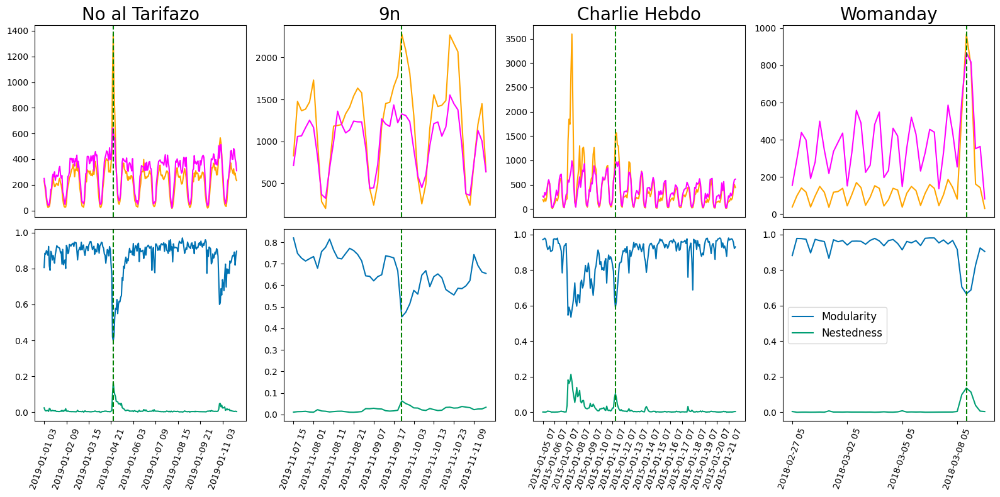

In [18]:
fig, axs = plt.subplots(2, 4)
axs = axs.flat
fig.set_size_inches(16,8)

for ax in axs:  # axs es una matriz, hay que aplanarla con .flat
    ax.set_facecolor("white")



plot_num_users_hashtags(axs[0], hour_nat_dt, hour_window_nat, num_users_nat, num_hashtags_nat, title="No al Tarifazo", inicio=0, legend=False, HORA_CRITICA=HORA_CRITICA_NAT)
plot_mod_nestedness(axs[4], hour_nat_dt, hour_window_nat, mod_sort_nat_b, nest_sort_nat_b, inicio=0, legend=False, tick_split=30, HORA_CRITICA=HORA_CRITICA_NAT)

plot_num_users_hashtags(axs[1], hour_9n_dt, hour_window_9n, num_users_9n, num_hashtags_9n, title="9n", inicio=0, legend=False, HORA_CRITICA=HORA_CRITICA_9N)
plot_mod_nestedness(axs[5], hour_9n_dt, hour_window_9n, mod_sort_9n_b, nest_sort_9n_b, inicio=0, legend=False, tick_split=5, HORA_CRITICA=HORA_CRITICA_9N)

plot_num_users_hashtags(axs[2], hour_ch_dt, hour_window_ch, num_users_ch, num_hashtags_ch, title="Charlie Hebdo", inicio=lim_ch_und, legend=False, HORA_CRITICA=HORA_CRITICA_CH) 
plot_mod_nestedness(axs[6], hour_ch_dt, hour_window_ch, mod_sort_ch_b, nest_sort_ch_b, inicio=lim_ch_und, legend=False, tick_split=12, HORA_CRITICA=HORA_CRITICA_CH)

plot_num_users_hashtags(axs[3], hour_wd_dt, hour_window_wd, num_users_wd, num_hashtags_wd, title="Womanday", inicio=lim_wd_und, legend=False, HORA_CRITICA=HORA_CRITICA_WD)
plot_mod_nestedness(axs[7], hour_wd_dt, hour_window_wd, mod_sort_wd_b, nest_sort_wd_b, inicio=lim_wd_und, legend=True, tick_split=12, HORA_CRITICA=HORA_CRITICA_WD)



plt.tight_layout()
plt.savefig(plots_folder + "num_unique_users_coef_mod.png")
plt.show()


## Función de Distribución de Probabilidad (PDF) y Función de Distribución Cumulativa Complementaria (CCDF) de las horas críticas

In [ ]:
plfit_nat, arr_pdf_points_nat, arr_ccdf_points_nat = calc_degree_distribution(HORA_CRITICA_NAT, "nat/" + str(hour_window_nat) + '/', mode="h", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, read=False)
plfit_9n, arr_pdf_points_9n, arr_ccdf_points_9n = calc_degree_distribution(HORA_CRITICA_9N, "9n/" + str(hour_window_9n) + '/', mode="h", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True)
plfit_ch, arr_pdf_points_ch, arr_ccdf_points_ch = calc_degree_distribution(HORA_CRITICA_CH, "ch/" + str(hour_window_ch) + '/', mode="h", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True)
plfit_wd, arr_pdf_points_wd, arr_ccdf_points_wd = calc_degree_distribution(HORA_CRITICA_WD, "wd/" + str(hour_window_wd) + '/', mode="h", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True)

100%|██████████| 1/1 [00:00<00:00, 84.57it/s]


Calculating best minimal value for power law fit


100%|██████████| 1/1 [00:00<00:00, 32768.00it/s]


Calculating best minimal value for power law fit


100%|██████████| 1/1 [00:00<00:00, 29330.80it/s]


Calculating best minimal value for power law fit


100%|██████████| 1/1 [00:00<00:00, 15592.21it/s]

Calculating best minimal value for power law fit


# AUTOSIMILITUD EN LAS REDES

## Grado medio por Kt

In [19]:
# MAX_UMBRAL es el máximo K_T que se va a usar para generar subgrafos
MAX_UMBRAL = 200

dict_hora_nat = get_dict_hora_kt("nat", HORA_CRITICA_NAT, hour_window=hour_window_nat, node_type="bipartite", MAX_UMBRAL=MAX_UMBRAL)
dict_hora_9n = get_dict_hora_kt("9n", HORA_CRITICA_9N, hour_window=hour_window_9n, node_type="bipartite", MAX_UMBRAL=MAX_UMBRAL)
dict_hora_ch = get_dict_hora_kt("ch", HORA_CRITICA_CH, hour_window=hour_window_ch, node_type="bipartite", MAX_UMBRAL=MAX_UMBRAL)
dict_hora_wd = get_dict_hora_kt("wd", HORA_CRITICA_WD, hour_window=hour_window_wd, node_type="bipartite", MAX_UMBRAL=MAX_UMBRAL)

  8%|▊         | 17/200 [00:00<00:00, 855.62it/s]


## Autosimilitud

In [20]:
# Seleccionamos el fichero correspondiente a la manifestación social de la que queremos sacar la red y seleccionamos la hora que queremos estudiar
dict_thres_avg_clust_nat_h, dict_norm_int_deg_nat_h = calc_self_sim(HORA_CRITICA_NAT, MAX_UMBRAL, "nat/" + str(hour_window_nat) + '/')
dict_thres_avg_clust_9n_h, dict_norm_int_deg_9n_h = calc_self_sim(HORA_CRITICA_9N, MAX_UMBRAL, "9n/" + str(hour_window_9n) + '/')
dict_thres_avg_clust_ch_h, dict_norm_int_deg_ch_h = calc_self_sim(HORA_CRITICA_CH, MAX_UMBRAL, "ch/" + str(hour_window_ch) + '/')
dict_thres_avg_clust_wd_h, dict_norm_int_deg_wd_h = calc_self_sim(HORA_CRITICA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + '/')

 36%|███▌      | 72/200 [00:00<00:00, 297.81it/s]


In [22]:
limit_kt_nat = 35
limit_kt_9n = 60
limit_kt_ch = 25
limit_kt_wd = 18

arr_kt_plot_nat = [0,4,8,9,10,12,14,15,16,18,20]
arr_kt_plot_9n = [0,10,15,20,25,30,35,40]
arr_kt_plot_ch = [0,7,9,11,13,15]
#arr_kt_plot_ch = [5]
arr_kt_plot_wd = [0,4,6,8,10,12]

arr_kt_plot_nat = [0]
arr_kt_plot_9n = [0]
arr_kt_plot_ch = [0]
#arr_kt_plot_ch = [5]
#arr_kt_plot_wd = [0,4,6,8,10,12]

In [23]:
_, arr_deg_prob_nat, arr_deg_comp_cum_nat = calc_degree_distribution(HORA_CRITICA_NAT, "nat/" + str(hour_window_nat) + '/', mode="h", measures_folder=measures_folder, arr_kt=arr_kt_plot_nat, exp=False, norm=True)
_, arr_deg_prob_9n, arr_deg_comp_cum_9n = calc_degree_distribution(HORA_CRITICA_9N,  "9n/" + str(hour_window_9n) + '/', mode="h", measures_folder=measures_folder, arr_kt=arr_kt_plot_9n, exp=False, norm=True)
_, arr_deg_prob_ch, arr_deg_comp_cum_ch = calc_degree_distribution(HORA_CRITICA_CH,  "ch/" + str(hour_window_ch) + '/', mode="h", measures_folder=measures_folder, arr_kt=arr_kt_plot_ch, exp=False, norm=True)
_, arr_deg_prob_wd, arr_deg_comp_cum_wd = calc_degree_distribution(HORA_CRITICA_WD,  "wd/" + str(hour_window_wd) + '/', mode="h", measures_folder=measures_folder, arr_kt=arr_kt_plot_wd, exp=False, norm=True)

100%|██████████| 6/6 [00:00<00:00, 25317.73it/s]


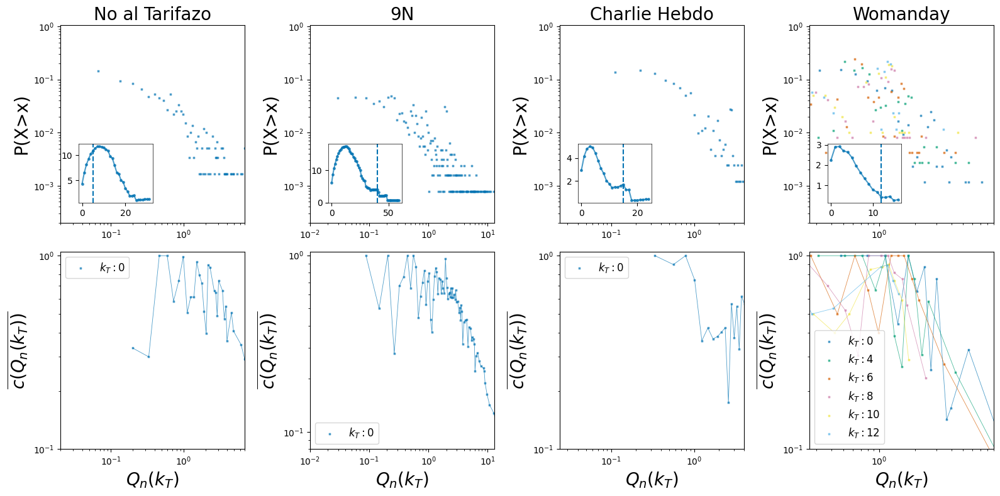

In [28]:

fig, axs = plt.subplots(2, 4)
fig.set_size_inches(16,8)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")

xlim_nat = (0.02, 7)
xlim_9n = (0.01, 13)
xlim_ch = (0.024, 4)
xlim_wd = (0.26, 9)

plot_pdf(axs[0], arr_deg_prob_nat, arr_kt_plot_nat, title="No al Tarifazo", ylabel="P(X>x)", ylim=(0.0002, 1.05), xlim=xlim_nat)
ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
plot_avg_deg(ax0_inset, dict_hora_nat, limit_kt_nat, axvline=5)

plot_pdf(axs[1], arr_deg_prob_9n, arr_kt_plot_9n, title="9N", ylim=(0.0002, 1.05), xlim=xlim_9n)
ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
plot_avg_deg(ax1_inset, dict_hora_9n, limit_kt_9n, axvline=40)

plot_pdf(axs[2], arr_deg_prob_ch, arr_kt_plot_ch, title="Charlie Hebdo", ylim=(0.0002, 1.05), xlim=xlim_ch)
ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
plot_avg_deg(ax2_inset, dict_hora_ch, limit_kt_ch, axvline=15)

plot_pdf(axs[3], arr_deg_prob_wd, arr_kt_plot_wd, title="Womanday", ylim=(0.0002, 1.05), xlim=xlim_wd)
ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
plot_avg_deg(ax3_inset, dict_hora_wd, limit_kt_wd, axvline=12)



plot_clust_ss(axs[4], arr_kt_plot_nat, dict_norm_int_deg_nat_h, xlim=xlim_nat, ylim=(0.1, 1.05))
plot_clust_ss(axs[5], arr_kt_plot_9n, dict_norm_int_deg_9n_h, xlim=xlim_9n, ylim=(0.08, 1.05))
plot_clust_ss(axs[6], arr_kt_plot_ch, dict_norm_int_deg_ch_h, xlim=xlim_ch, ylim=(0.1, 1.05))
plot_clust_ss(axs[7], arr_kt_plot_wd, dict_norm_int_deg_wd_h, xlim=xlim_wd, ylim=(0.1, 1.05))



plt.tight_layout()
plt.savefig(plots_folder + "CCDF_degree_self_sim_paper.png")
plt.show()

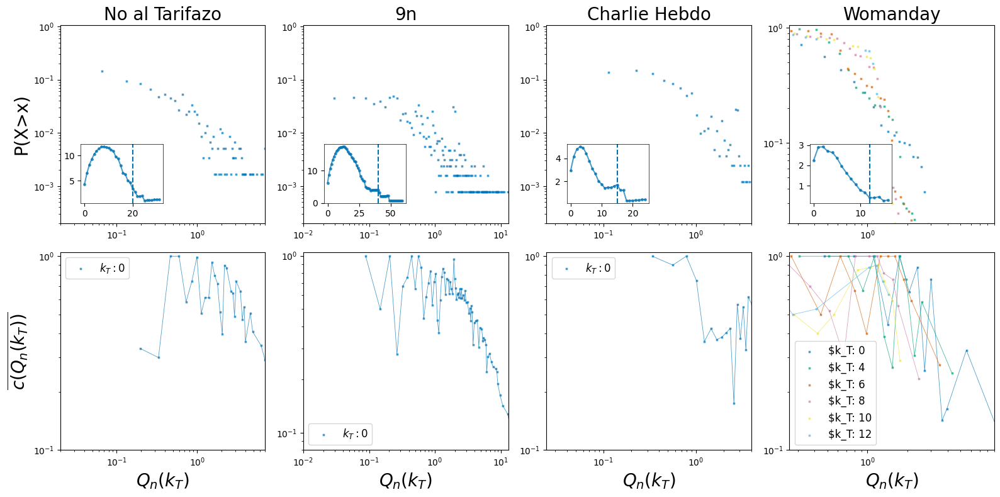

In [25]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(2, 4)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,8)

xlim_nat = (0.02, 7)
xlim_9n = (0.01, 13)
xlim_ch = (0.024, 4)
xlim_wd = (0.26, 9)


dot_size=4
marker = "" \
"x"
alpha=0.7

for index, points in enumerate(arr_deg_prob_nat):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_nat[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.0002, 1.05)
axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
axs[0].set_title("No al Tarifazo", fontsize=20)
#axs[0].set_xlabel("")
axs[0].set_ylabel("P(X>x)", fontsize=20)


with plt.style.context('seaborn-v0_8-colorblind'):
    ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
    ax0_inset.set_facecolor('xkcd:white')
    for spine in ax0_inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    ax0_inset.get_xaxis().set_visible(True)
    ax0_inset.plot(list(dict_hora_nat.keys())[0:limit_kt_nat], list(dict_hora_nat.values())[0:limit_kt_nat], alpha=alpha)
    ax0_inset.scatter(list(dict_hora_nat.keys())[0:limit_kt_nat], list(dict_hora_nat.values())[0:limit_kt_nat], s=6, alpha=alpha)
    ax0_inset.axvline(20, ls="--")
    #ax0_inset.set_ylabel("avg_deg")
    #ax0_inset.set_xlabel("$K_t$")

for index, points in enumerate(arr_deg_prob_9n):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.0002, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)
#axs[1].set_xlabel("")
with plt.style.context('seaborn-v0_8-colorblind'):
    ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
    ax1_inset.set_facecolor('xkcd:white')
    for spine in ax1_inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    ax1_inset.get_xaxis().set_visible(True)
    ax1_inset.plot(list(dict_hora_9n.keys())[0:limit_kt_9n], list(dict_hora_9n.values())[0:limit_kt_9n], alpha=alpha)
    ax1_inset.scatter(list(dict_hora_9n.keys())[0:limit_kt_9n], list(dict_hora_9n.values())[0:limit_kt_9n], s=6, alpha=alpha)
    ax1_inset.axvline(40, ls="--")
    #ax1_inset.set_ylabel("avg_deg")
    #ax1_inset.set_xlabel("$K_t$")

for index, points in enumerate(arr_deg_prob_ch):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.0002, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)
#axs[2].set_xlabel("")
with plt.style.context('seaborn-v0_8-colorblind'):
    ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
    ax2_inset.set_facecolor('xkcd:white')
    for spine in ax2_inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    ax2_inset.get_xaxis().set_visible(True)
    ax2_inset.plot(list(dict_hora_ch.keys())[0:limit_kt_ch], list(dict_hora_ch.values())[0:limit_kt_ch], alpha=alpha)
    ax2_inset.scatter(list(dict_hora_ch.keys())[0:limit_kt_ch], list(dict_hora_ch.values())[0:limit_kt_ch], s=6, alpha=alpha)
    ax2_inset.axvline(15, ls="--")
    #ax2_inset.set_ylabel("avg_deg")
    #ax2_inset.set_xlabel("$K_t$")

for index, points in enumerate(arr_deg_comp_cum_wd):
    axs[3].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_wd[index]))
axs[3].set_xscale('log')
axs[3].set_yscale('log')
axs[3].set_ylim(0.02, 1.05)
axs[3].set_xlim(xlim_wd[0], xlim_wd[1])
axs[3].set_title("Womanday", fontsize=20)
#axs[3].set_xlabel("")
with plt.style.context('seaborn-v0_8-colorblind'):
    ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
    ax3_inset.set_facecolor('xkcd:white')
    for spine in ax3_inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    ax3_inset.get_xaxis().set_visible(True)
    ax3_inset.plot(list(dict_hora_wd.keys())[0:limit_kt_wd], list(dict_hora_wd.values())[0:limit_kt_wd], alpha=alpha)
    ax3_inset.scatter(list(dict_hora_wd.keys())[0:limit_kt_wd], list(dict_hora_wd.values())[0:limit_kt_wd], s=6, alpha=alpha)
    ax3_inset.axvline(12, ls="--")
    #ax3_inset.set_ylabel("avg_deg")
    #ax3_inset.set_xlabel("$K_t$")





for index, kt in enumerate(arr_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_nat_h.keys():
        points_x = list(dict_norm_int_deg_nat_h[kt].keys())[::2]
        points_y = list(dict_norm_int_deg_nat_h[kt].values())[::2]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[4].set_xlabel("$Q_n(k_T)$", fontsize=20)
axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_nat[0], xlim_nat[1])
axs[4].legend(prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h.keys():
        points_x = list(dict_norm_int_deg_9n_h[kt].keys())[::2]
        points_y = list(dict_norm_int_deg_9n_h[kt].values())[::2]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[5].set_xscale('log')  
axs[5].set_yscale('log')      
axs[5].set_ylim(0.08, 1.05)
axs[5].set_xlim(xlim_9n[0], xlim_9n[1])

axs[5].legend(prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h.keys():
        points_x = list(dict_norm_int_deg_ch_h[kt].keys())[:-1:2]
        points_y = list(dict_norm_int_deg_ch_h[kt].values())[:-1:2]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[6].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[6].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[6].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[6].set_xscale('log')  
axs[6].set_yscale('log')          
axs[6].set_ylim(0.1, 1.05)
axs[6].set_xlim(xlim_ch[0], xlim_ch[1])
axs[6].legend(prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_wd[:]):
    if kt in dict_norm_int_deg_wd_h.keys():
        points_x = list(dict_norm_int_deg_wd_h[kt].keys())[:-1:2]
        points_y = list(dict_norm_int_deg_wd_h[kt].values())[:-1:2]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_wd_h[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[7].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[7].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}')        

axs[7].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[7].set_xscale('log')  
axs[7].set_yscale('log')      
axs[7].legend(loc="lower left", prop={'size': 12})
axs[7].set_ylim(0.1, 1.05)
axs[7].set_xlim(xlim_wd[0], xlim_wd[1])

plt.tight_layout()
plt.savefig(plots_folder + "CCDF_degree_self_sim_paper.png")
plt.show()

## Uso de d-mercator

Los archivos de código relativos al uso de d-mercator se encuentran en la carpeta ```d-mercator/``` del presente repositorio.

## Grafos Filtrados

### Ajuste a ley de potencia de los grafos filtrados

In [20]:
# Threshold empleado para cada manifestacion
umbral_nat = 3
umbral_9n = 5
umbral_ch = 3
umbral_wd = 2

umbral_otro_nat = 1
umbral_otro_9n = 3
umbral_otro_ch = 2
umbral_otro_wd = 3

In [21]:
hour_window_nat, hour_window_9n, hour_window_ch, hour_window_wd

(1, 2, 2, 6)

In [22]:
HORA_CRITICA_NAT, HORA_CRITICA_9N, HORA_CRITICA_CH, HORA_CRITICA_WD

('429624', '437037', '394717', '422369')

In [23]:
OTRA_HORA_NAT = "429600"
OTRA_HORA_9N = "437000"
OTRA_HORA_CH = "394628"
"""OTRA_HORA_WD = "422303"""

'OTRA_HORA_WD = "422303'

In [24]:
# CREACIÓN DE LOS GRAFOS FILTRADOS
write_filtered_graph("nat", HORA_CRITICA_NAT, umbral_nat, graphs_folder, hour_window_nat)
write_filtered_graph("9n", HORA_CRITICA_9N, umbral_9n, graphs_folder, hour_window_9n)
write_filtered_graph("ch", HORA_CRITICA_CH, umbral_ch, graphs_folder, hour_window_ch)
"""write_filtered_graph("wd", HORA_CRITICA_WD, umbral_wd, hour_window_wd)"""

Grafo nat:429624  (umbral 3) reducido a 19.16 % en nodos y  16.85 % en aristas.
Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.
Grafo ch:394717  (umbral 3) reducido a 13.31 % en nodos y  7.4 % en aristas.


'write_filtered_graph("wd", HORA_CRITICA_WD, umbral_wd, hour_window_wd)'

In [25]:
# CREACIÓN DE LOS GRAFOS FILTRADOS DE OTRAS HORAS NO CRITICAS

write_filtered_graph("nat", OTRA_HORA_NAT, umbral_otro_nat, graphs_folder, hour_window_nat)
write_filtered_graph("9n", OTRA_HORA_9N, umbral_otro_9n, graphs_folder, hour_window_9n)
write_filtered_graph("ch", OTRA_HORA_CH, umbral_otro_ch, graphs_folder, hour_window_ch)
"""write_filtered_graph("wd", OTRA_HORA_WD, umbral_otro_wd, hour_window_wd)"""

Grafo nat:429600  (umbral 1) reducido a 47.71 % en nodos y  79.71 % en aristas.
Grafo 9n:437000  (umbral 3) reducido a 9.13 % en nodos y  2.67 % en aristas.
Grafo ch:394628  (umbral 2) reducido a 25.64 % en nodos y  26.46 % en aristas.


'write_filtered_graph("wd", OTRA_HORA_WD, umbral_otro_wd, hour_window_wd)'

### Grado medio por kt

In [26]:
# MAX_UMBRAL es el máximo K_T que se va a usar para generar subgrafos
MAX_UMBRAL = 200

dict_hora_nat_f = {}
G_nat = nx.read_gexf(graphs_folder + f"filtered/{umbral_nat}/nat/" + str(hour_window_nat) + '/' + HORA_CRITICA_NAT + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_nat_f.keys():
        # Se crea el subgrafo basandose en el threshold seleccionado
        F = thresh_normalization(G_nat,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_nat_f[threshold] = calc_avg_degree(F)

dict_otra_hora_nat_f = {}
G_nat = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_nat}/nat/" + str(hour_window_nat) + '/' + OTRA_HORA_NAT + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_nat_f.keys():
        # Se crea el subgrafo basandose en el threshold seleccionado
        F = thresh_normalization(G_nat,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_nat_f[threshold] = calc_avg_degree(F)


dict_hora_9n_f = {}
G_9n = nx.read_gexf(graphs_folder + f"filtered/{umbral_9n}/9n/" + str(hour_window_9n) + '/' + HORA_CRITICA_9N + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_9n_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_9n,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_9n_f[threshold] = calc_avg_degree(F)


dict_otra_hora_9n_f = {}
G_9n = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_9n}/9n/" + str(hour_window_9n) + '/' + OTRA_HORA_9N + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_9n_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_9n,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_9n_f[threshold] = calc_avg_degree(F)


dict_hora_ch_f = {}
G_ch = nx.read_gexf(graphs_folder + f"filtered/{umbral_ch}/ch/" + str(hour_window_ch) + '/' + HORA_CRITICA_CH + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_ch_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_ch,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_ch_f[threshold] = calc_avg_degree(F)


dict_otra_hora_ch_f = {}
G_ch = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_ch}/ch/" + str(hour_window_ch) + '/' + OTRA_HORA_CH + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_ch_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_ch,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_ch_f[threshold] = calc_avg_degree(F)



 76%|███████▌  | 151/200 [00:00<00:00, 5769.70it/s]


In [27]:
limit_kt_nat = 35
limit_kt_9n = 60
limit_kt_ch = 30
limit_kt_wd = 18

critical_kt_nat = 10
critical_kt_9n = 18
critical_kt_ch = 5
critical_kt_wd = 7

arr_kt_plot_nat = [0,4,6,8,10]
arr_kt_plot_9n = [0,6,9,12,15,18]
arr_kt_plot_ch = [0,1,2,3,4,5]
arr_kt_plot_wd = [0,1,2,3,4,5,6,7]


critical_otra_kt_nat = 10
critical_otra_kt_9n = 18
critical_otra_kt_ch = 5

arr_otra_kt_plot_nat = [0,3,6,9,12,15,18]
arr_otra_kt_plot_9n = [0,1,2,3,4,5]
arr_otra_kt_plot_ch =  [0,2,4,6,8,10]

In [28]:
plfit_nat_f, arr_pdf_points_nat_f, arr_ccdf_points_nat_f = calc_degree_distribution(HORA_CRITICA_NAT, "nat/" + str(hour_window_nat) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_nat, thresh_filt=umbral_nat, norm=True)
plfit_9n_f, arr_pdf_points_9n_f, arr_ccdf_points_9n_f = calc_degree_distribution(HORA_CRITICA_9N, "9n/" + str(hour_window_9n) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_9n, thresh_filt=umbral_9n, norm=True)
plfit_ch_f, arr_pdf_points_ch_f, arr_ccdf_points_ch_f = calc_degree_distribution(HORA_CRITICA_CH, "ch/" + str(hour_window_ch) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_ch, thresh_filt=umbral_ch, norm=True)
"""plfit_wd, arr_pdf_points_wd, arr_ccdf_points_wd = calc_degree_distribution(HORA_CRITICA_WD, "wd/" + str(hour_window_wd) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_wd, thresh_filt=umbral_wd, norm=True)"""

plfit_otra_nat_f, arr_pdf_points_otra_nat_f, arr_ccdf_points_otra_nat_f = calc_degree_distribution(OTRA_HORA_NAT, "nat/" + str(hour_window_nat) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_nat, thresh_filt=umbral_otro_nat, norm=True)
plfit_otra_9n_f, arr_pdf_points_otra_9n_f, arr_ccdf_points_otra_9n_f = calc_degree_distribution(OTRA_HORA_9N, "9n/" + str(hour_window_9n) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_9n, thresh_filt=umbral_otro_9n, norm=True)
plfit_otra_ch_f, arr_pdf_points_otra_ch_f, arr_ccdf_points_otra_ch_f = calc_degree_distribution(OTRA_HORA_CH, "ch/" + str(hour_window_ch) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_ch, thresh_filt=umbral_otro_ch, norm=True)
"""plfit_otra_wd, arr_pdf_points_otra_wd, arr_ccdf_points_otra_wd = calc_degree_distribution(OTRA_HORA_WD, "wd/" + str(hour_window_wd) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_wd, thresh_filt=umbral_otro_wd, norm=True)"""

100%|██████████| 5/5 [00:00<00:00, 39346.19it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 20360.70it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 42871.93it/s]


Calculating best minimal value for power law fit


100%|██████████| 7/7 [00:00<00:00, 45378.87it/s]
Less than 2 unique data values left after xmin and xmax options! Cannot fit. Returning nans.


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 41596.40it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 39882.45it/s]

Calculating best minimal value for power law fit


'plfit_otra_wd, arr_pdf_points_otra_wd, arr_ccdf_points_otra_wd = calc_degree_distribution(OTRA_HORA_WD, "wd/" + str(hour_window_wd) + \'/\', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_wd, thresh_filt=umbral_otro_wd, norm=True)'

### Autosimilitud de redes filtradas y Resultados en otras ventanas temporales diferentes a la crítica

In [29]:
OTRA_HORA_NAT, hour_window_nat

('429600', 1)

In [30]:
# MAX_UMBRAL es el máximo K_T que vamos a usar para generar subgrafos
MAX_UMBRAL = 500
# Seleccionamos el fichero correspondiente a la manifestación social de la que queremos sacar la red y seleccionamos la hora que queremos estudiar
dict_thres_avg_clust_nat_h_f, dict_norm_int_deg_nat_h_f = calc_self_sim(HORA_CRITICA_NAT, MAX_UMBRAL, "nat/" + str(hour_window_nat) + '/', mode="f", thresh_filter=umbral_nat)
dict_thres_avg_clust_9n_h_f, dict_norm_int_deg_9n_h_f = calc_self_sim(HORA_CRITICA_9N, MAX_UMBRAL, "9n/" + str(hour_window_9n) + '/', mode="f", thresh_filter=umbral_9n)
dict_thres_avg_clust_ch_h_f, dict_norm_int_deg_ch_h_f = calc_self_sim(HORA_CRITICA_CH, MAX_UMBRAL, "ch/" + str(hour_window_ch) + '/', mode="f", thresh_filter=umbral_ch)
"""dict_thres_avg_clust_wd_h, dict_norm_int_deg_wd_h = calc_self_sim(HORA_CRITICA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + '/', mode="f", thresh_filter=umbral_wd)"""


dict_thres_avg_clust_otra_nat_h_f, dict_norm_int_deg_otra_nat_h_f = calc_self_sim(OTRA_HORA_NAT, MAX_UMBRAL, "nat/" + str(hour_window_nat) + '/', mode="f", thresh_filter=umbral_otro_nat)
dict_thres_avg_clust_otra_9n_h_f, dict_norm_int_deg_otra_9n_h_f = calc_self_sim(OTRA_HORA_9N, MAX_UMBRAL, "9n/" + str(hour_window_9n) + '/', mode="f", thresh_filter=umbral_otro_9n)
dict_thres_avg_clust_otra_ch_h_f, dict_norm_int_deg_otra_ch_h_f = calc_self_sim(OTRA_HORA_CH, MAX_UMBRAL, "ch/" + str(hour_window_ch) + '/', mode="f", thresh_filter=umbral_otro_ch)
"""dict_thres_avg_clust_otra_wd_h, dict_norm_int_deg_otra_wd_h = calc_self_sim(OTRA_HORA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + '/', mode="f", thresh_filter=umbral_otro_wd)"""

  0%|          | 0/500 [00:00<?, ?it/s]

 30%|███       | 151/500 [00:00<00:00, 878.47it/s]


'dict_thres_avg_clust_otra_wd_h, dict_norm_int_deg_otra_wd_h = calc_self_sim(OTRA_HORA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + \'/\', mode="f", thresh_filter=umbral_otro_wd)'

In [32]:
print("Alpha filtered NAT: ", get_exp_from_pdf(arr_pdf_points_nat_f))
print("Alpha filtered 9n: ", get_exp_from_pdf(arr_pdf_points_9n_f))
print("Alpha filteredc ch: ", get_exp_from_pdf(arr_pdf_points_ch_f))

Calculating best minimal value for power law fit
Alpha filtered NAT:  5.30797528951701
Calculating best minimal value for power law fit


Less than 2 unique data values left after xmin and xmax options! Cannot fit. Returning nans.
/home/msuarez/Escritorio/self_similarity/poster_cs3/github/self-similarity-in-social-movements/venv/lib/python3.12/site-packages/powerlaw.py:1151: RuntimeWarning: invalid value encountered in scalar divide
  self.alpha = 1 + (self.n / sum(log(data/self.xmin)))


Alpha filtered 9n:  nan
Calculating best minimal value for power law fit
Alpha filteredc ch:  1483.9997752304696


/home/msuarez/Escritorio/self_similarity/poster_cs3/github/self-similarity-in-social-movements/venv/lib/python3.12/site-packages/powerlaw.py:1170: RuntimeWarning: invalid value encountered in scalar divide
  return 1 + len(data)/sum(log(data / (self.xmin)))
Not enough data. Returning nan
Not enough data. Returning nan


In [33]:
def configure_inset(inset):
    inset.set_facecolor('xkcd:white')
    for spine in inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    inset.get_xaxis().set_visible(True)
    return inset
    

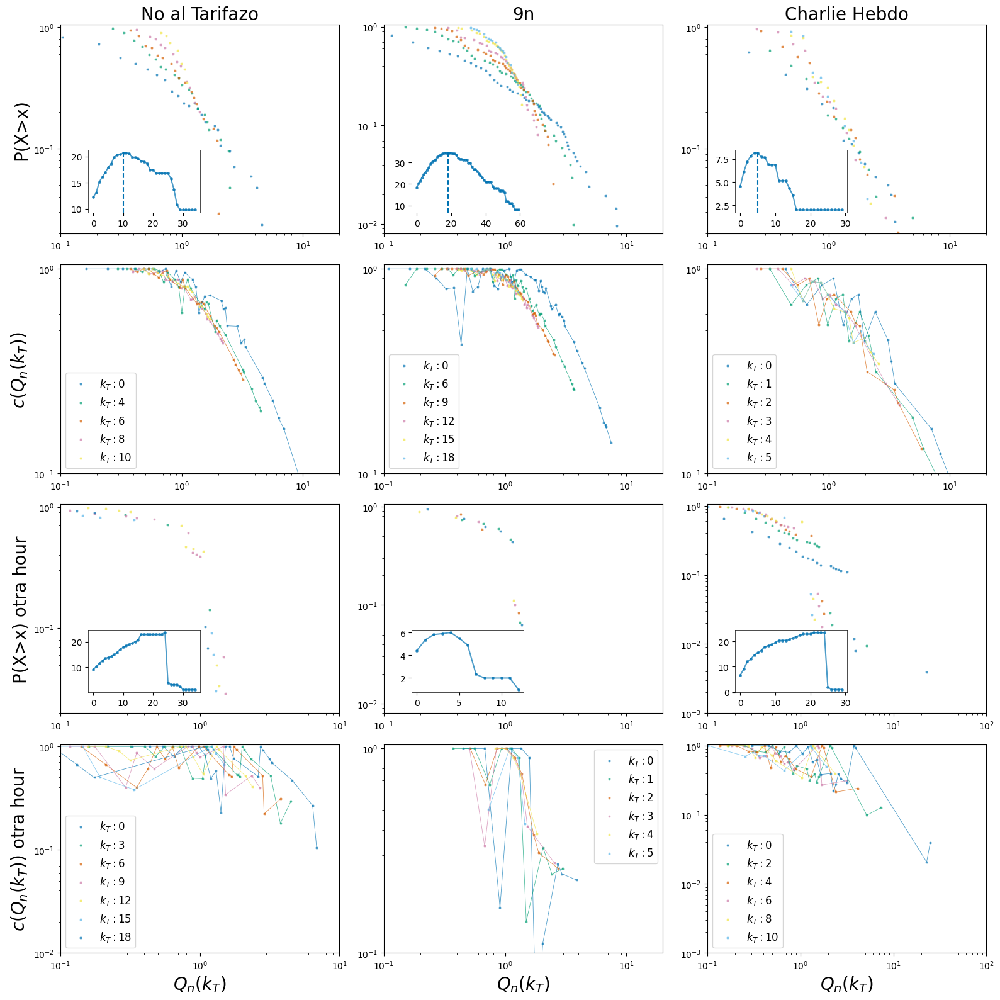

In [37]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(4, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,16)

xlim_nat = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_nat = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_nat_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_nat[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
axs[0].set_title("No al Tarifazo", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
ax0_inset.scatter(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
ax0_inset.axvline(critical_kt_nat, ls="--")

for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
ax1_inset.axvline(critical_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
ax2_inset.axvline(critical_kt_ch, ls="--")


for index, kt in enumerate(arr_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_nat[0], xlim_nat[1])
axs[3].legend(loc="lower left", prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

axs[4].legend(loc="lower left", prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])
axs[5].legend(loc="lower left", prop={'size': 12})


for index, points in enumerate(arr_ccdf_points_otra_nat_f):
    axs[6].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_nat[index]))
axs[6].set_xscale('log')
axs[6].set_yscale('log')
axs[6].set_ylim(0.02, 1.05)
axs[6].set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
axs[6].set_ylabel("P(X>x) otra hour", fontsize=20)


ax6_inset = axs[6].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax6_inset)
ax6_inset.plot(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
ax6_inset.scatter(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
#ax6_inset.axvline(critical_otra_kt_nat, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    axs[7].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
axs[7].set_xscale('log')
axs[7].set_yscale('log')
axs[7].set_ylim(0.008, 1.05)
axs[7].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
ax7_inset = axs[7].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax7_inset)
ax7_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax7_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
#ax7_inset.axvline(critical_otra_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    axs[8].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
axs[8].set_xscale('log')
axs[8].set_yscale('log')
axs[8].set_ylim(0.001, 1.05)
axs[8].set_xlim(xlim_otra_ch[0], 100)
ax8_inset = axs[8].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax8_inset)
ax8_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax8_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
#ax8_inset.axvline(critical_otra_kt_ch, ls="--")


for index, kt in enumerate(arr_otra_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_otra_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[9].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[9].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[9].set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
axs[9].set_xlabel("$Q_n(k_T)$", fontsize=20)
axs[9].set_xscale('log')  
axs[9].set_yscale('log')      
axs[9].set_ylim(0.01, 1.05)
axs[9].set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
axs[9].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[10].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[10].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[10].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[10].set_xscale('log')  
axs[10].set_yscale('log')      
axs[10].set_ylim(0.1, 1.05)
axs[10].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])

axs[10].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[11].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[11].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[11].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[11].set_xscale('log')  
axs[11].set_yscale('log')          
axs[11].set_ylim(0.001, 1.05)
axs[11].set_xlim(xlim_otra_ch[0], 100)
axs[11].legend(prop={'size': 12})




plt.tight_layout()
plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

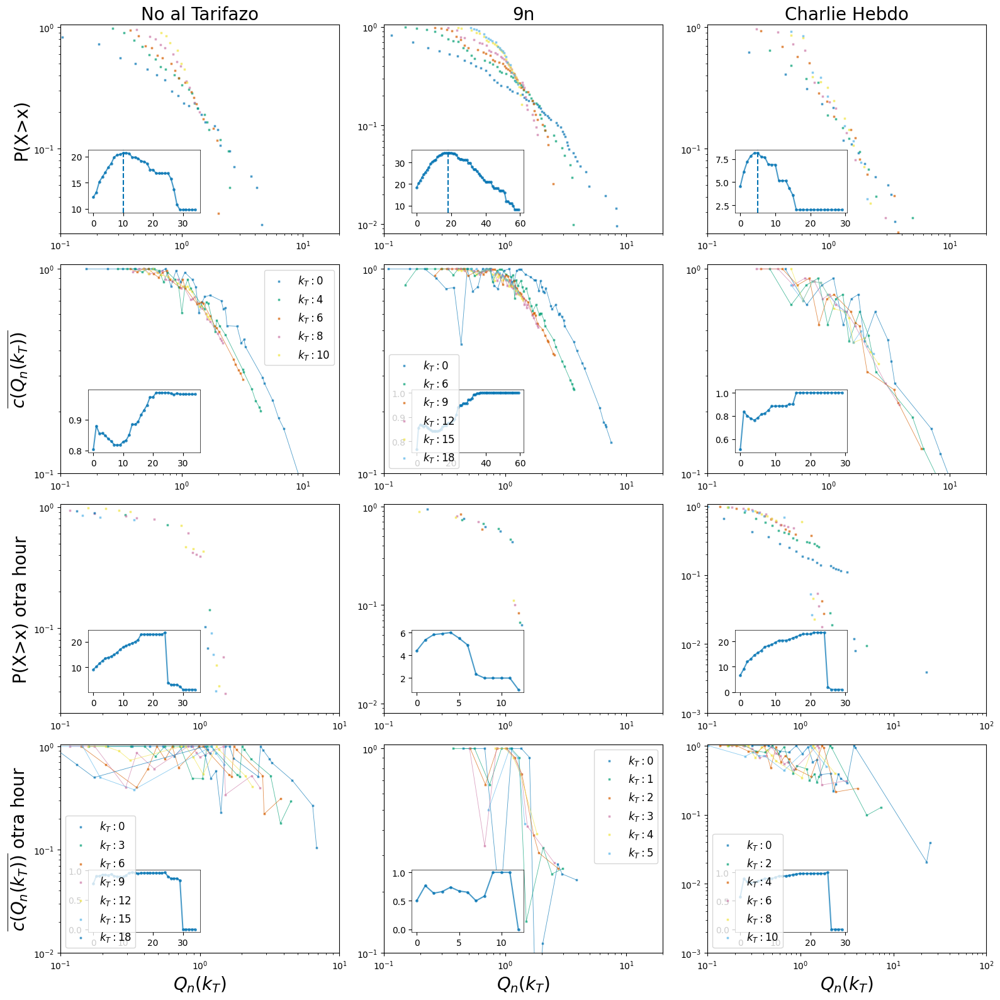

In [38]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(4, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,16)

xlim_nat = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_nat = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_nat_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_nat[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
axs[0].set_title("No al Tarifazo", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
ax0_inset.scatter(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
ax0_inset.axvline(critical_kt_nat, ls="--")

for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
ax1_inset.axvline(critical_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
ax2_inset.axvline(critical_kt_ch, ls="--")


for index, kt in enumerate(arr_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_nat[0], xlim_nat[1])

ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)
ax3_inset.plot(list(dict_thres_avg_clust_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_nat_h_f.values())[0:limit_kt_nat], alpha=alpha)
ax3_inset.scatter(list(dict_thres_avg_clust_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_nat_h_f.values())[0:limit_kt_nat], s=6, alpha=alpha)

#axs[3].legend(loc="lower left", prop={'size': 12})
axs[3].legend(prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)
ax4_inset.plot(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax4_inset.scatter(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

#axs[4].legend(loc="lower left", prop={'size': 12})
axs[4].legend(prop={'size': 12})




for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])

ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)
ax5_inset.plot(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax5_inset.scatter(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

#axs[5].legend(loc="lower left", prop={'size': 12})
axs[4].legend(prop={'size': 12})


for index, points in enumerate(arr_ccdf_points_otra_nat_f):
    axs[6].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_nat[index]))
axs[6].set_xscale('log')
axs[6].set_yscale('log')
axs[6].set_ylim(0.02, 1.05)
axs[6].set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
axs[6].set_ylabel("P(X>x) otra hour", fontsize=20)


ax6_inset = axs[6].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax6_inset)
ax6_inset.plot(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
ax6_inset.scatter(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
#ax6_inset.axvline(critical_otra_kt_nat, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    axs[7].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
axs[7].set_xscale('log')
axs[7].set_yscale('log')
axs[7].set_ylim(0.008, 1.05)
axs[7].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
ax7_inset = axs[7].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax7_inset)
ax7_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax7_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
#ax7_inset.axvline(critical_otra_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    axs[8].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
axs[8].set_xscale('log')
axs[8].set_yscale('log')
axs[8].set_ylim(0.001, 1.05)
axs[8].set_xlim(xlim_otra_ch[0], 100)
ax8_inset = axs[8].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax8_inset)
ax8_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax8_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
#ax8_inset.axvline(critical_otra_kt_ch, ls="--")


for index, kt in enumerate(arr_otra_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_otra_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[9].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[9].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[9].set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
axs[9].set_xlabel("$Q_n(k_T)$", fontsize=20)
axs[9].set_xscale('log')  
axs[9].set_yscale('log')      
axs[9].set_ylim(0.01, 1.05)
axs[9].set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
axs[9].legend(prop={'size': 12})

ax9_inset = axs[9].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax9_inset)
ax9_inset.plot(list(dict_thres_avg_clust_otra_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_otra_nat_h_f.values())[0:limit_kt_nat], alpha=alpha)
ax9_inset.scatter(list(dict_thres_avg_clust_otra_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_otra_nat_h_f.values())[0:limit_kt_nat], s=6, alpha=alpha)

#axs[9].legend(loc="lower left", prop={'size': 12})
axs[9].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[10].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[10].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[10].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[10].set_xscale('log')  
axs[10].set_yscale('log')      
axs[10].set_ylim(0.1, 1.05)
axs[10].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])


ax10_inset = axs[10].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax10_inset)
ax10_inset.plot(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax10_inset.scatter(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

#axs[10].legend(loc="lower left", prop={'size': 12})
axs[10].legend(prop={'size': 12})



for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[11].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[11].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[11].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[11].set_xscale('log')  
axs[11].set_yscale('log')          
axs[11].set_ylim(0.001, 1.05)
axs[11].set_xlim(xlim_otra_ch[0], 100)

ax11_inset = axs[11].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax11_inset)
ax11_inset.plot(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax11_inset.scatter(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

#axs[11].legend(loc="lower left", prop={'size': 12})
axs[11].legend(prop={'size': 12})



plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

### Figura 1: 2x2:
    CCDF en inset CCDF de otra hora
    SS en inset SS de otra hora

### Figura 2: 2x2
    AVg degree por kt
    Clust promedio por kt

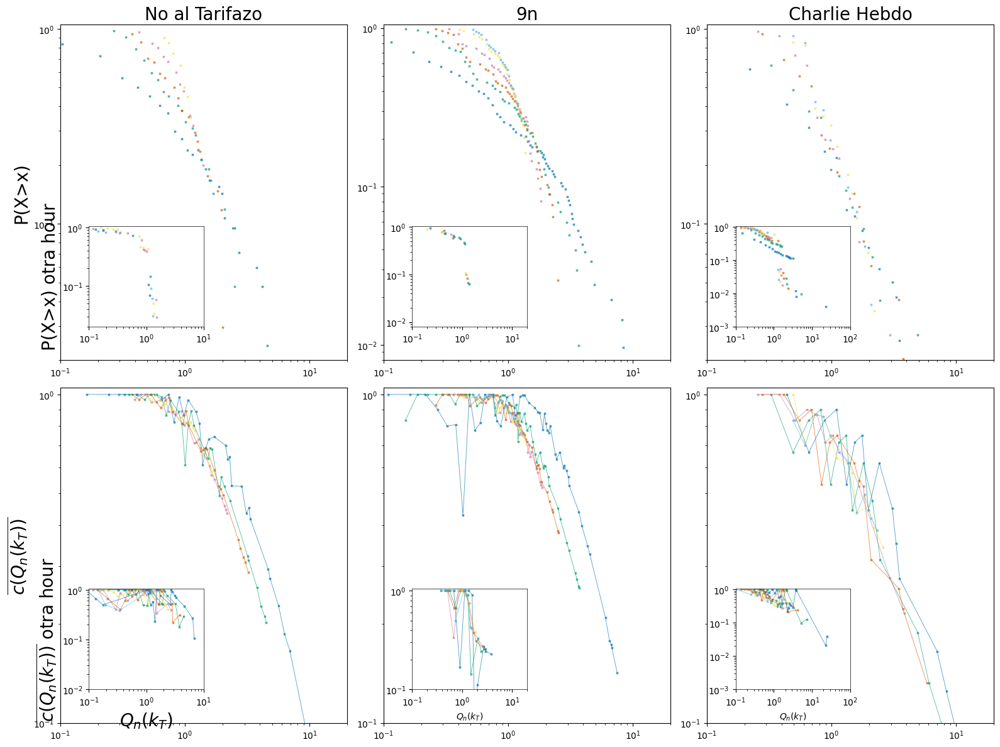

In [45]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(2, 3)
axs = axs.flat 
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,12)

xlim_nat = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_nat = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_nat_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_T$ = " + str(arr_kt_plot_nat[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
axs[0].set_title("No al Tarifazo", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
for index, points in enumerate(arr_ccdf_points_otra_nat_f):
    ax0_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_nat[index]))
ax0_inset.set_xscale('log')
ax0_inset.set_yscale('log')
ax0_inset.set_ylim(0.02, 1.05)
ax0_inset.set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
ax0_inset.set_ylabel("P(X>x) otra hour", fontsize=20)


for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    ax1_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
ax1_inset.set_xscale('log')
ax1_inset.set_yscale('log')
ax1_inset.set_ylim(0.008, 1.05)
ax1_inset.set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])


for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    ax2_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
ax2_inset.set_xscale('log')
ax2_inset.set_yscale('log')
ax2_inset.set_ylim(0.001, 1.05)
ax2_inset.set_xlim(xlim_otra_ch[0], 100)




for index, kt in enumerate(arr_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_nat[0], xlim_nat[1])

ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)


for index, kt in enumerate(arr_otra_kt_plot_nat[:]):
    if kt in dict_norm_int_deg_otra_nat_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_nat_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_nat_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_nat_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax3_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax3_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax3_inset.set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
ax3_inset.set_xlabel("$Q_n(k_T)$", fontsize=20)
ax3_inset.set_xscale('log')  
ax3_inset.set_yscale('log')      
ax3_inset.set_ylim(0.01, 1.05)
ax3_inset.set_xlim(xlim_otra_nat[0], xlim_otra_nat[1])
#ax3_inset.legend(prop={'size': 12})



for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)

for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax4_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax4_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax4_inset.set_xlabel("$Q_n(k_T$)", fontsize=10)
ax4_inset.set_xscale('log')  
ax4_inset.set_yscale('log')      
ax4_inset.set_ylim(0.1, 1.05)
ax4_inset.set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
 





for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])

ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)


for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax5_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax5_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax5_inset.set_xlabel("$Q_n(k_T$)", fontsize=10)
ax5_inset.set_xscale('log')  
ax5_inset.set_yscale('log')          
ax5_inset.set_ylim(0.001, 1.05)
ax5_inset.set_xlim(xlim_otra_ch[0], 100)



plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

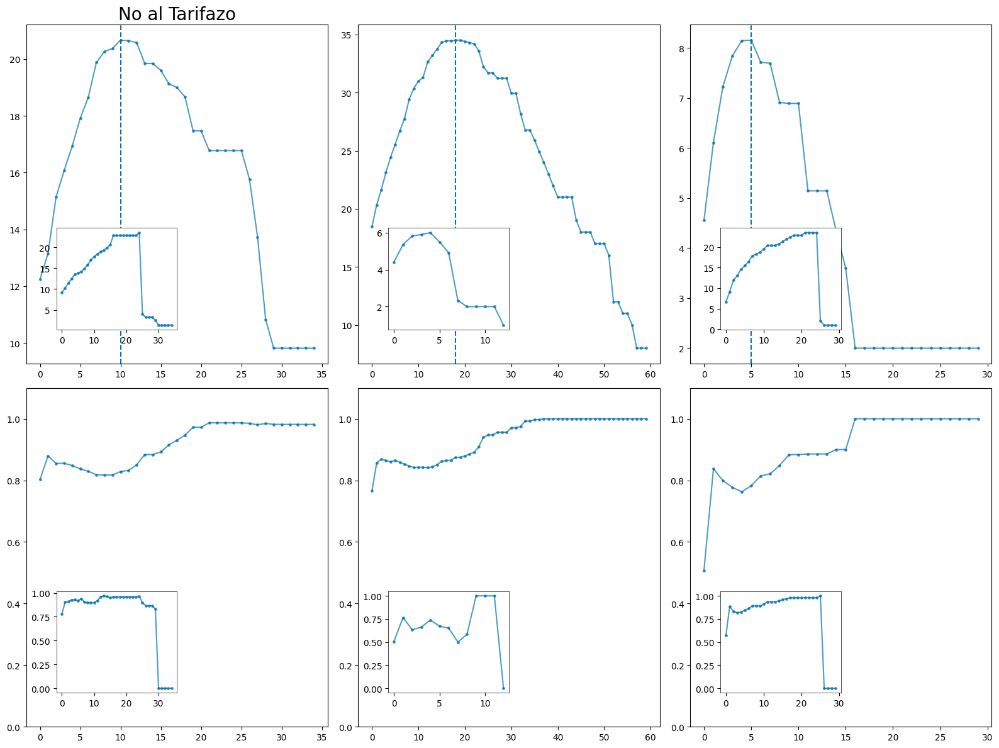

In [40]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(2, 3)
axs = axs.flat 
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,12)

xlim_nat = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_nat = (0.1, 10)
xlim_otra_9n = (0.1, 20) 
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

axs[0].set_title("No al Tarifazo", fontsize=20)
axs[0].plot(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
axs[0].scatter(list(dict_hora_nat_f.keys())[0:limit_kt_nat], list(dict_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
axs[0].axvline(critical_kt_nat, ls="--")
ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], alpha=alpha)
ax0_inset.scatter(list(dict_otra_hora_nat_f.keys())[0:limit_kt_nat], list(dict_otra_hora_nat_f.values())[0:limit_kt_nat], s=6, alpha=alpha)



axs[1].plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
axs[1].scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
axs[1].axvline(critical_kt_9n, ls="--")
ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)


axs[2].plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
axs[2].scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
axs[2].axvline(critical_kt_ch, ls="--")
ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

axs[3].plot(list(dict_thres_avg_clust_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_nat_h_f.values())[0:limit_kt_nat], alpha=alpha)
axs[3].scatter(list(dict_thres_avg_clust_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_nat_h_f.values())[0:limit_kt_nat], s=6, alpha=alpha)
axs[3].set_ylim(0,1.1)
ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)
ax3_inset.plot(list(dict_thres_avg_clust_otra_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_otra_nat_h_f.values())[0:limit_kt_nat], alpha=alpha)
ax3_inset.scatter(list(dict_thres_avg_clust_otra_nat_h_f.keys())[0:limit_kt_nat], list(dict_thres_avg_clust_otra_nat_h_f.values())[0:limit_kt_nat], s=6, alpha=alpha)


axs[4].plot(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
axs[4].scatter(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
axs[4].set_ylim(0,1.1)
ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)
ax4_inset.plot(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax4_inset.scatter(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

axs[5].plot(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
axs[5].scatter(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
axs[5].set_ylim(0,1.1)
ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)
ax5_inset.plot(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax5_inset.scatter(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)






plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

#  Gráfica CCDFs pre y post filtrado

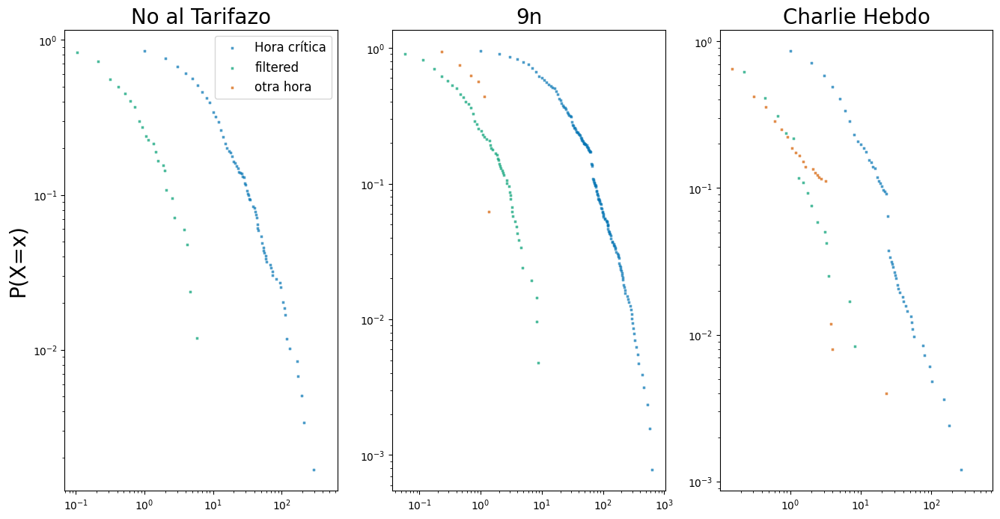

In [44]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(1, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,8)



dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []
axs[0].set_title("No al Tarifazo", fontsize=20)
for index, points in enumerate(arr_ccdf_points_nat[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[0].set_xscale('log')
axs[0].set_yscale('log')
#axs[0].set_ylim(0.0002, 1.05)
#axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
axs[0].set_ylabel("P(X=x)", fontsize=20)

for index, points in enumerate(arr_ccdf_points_9n[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[1].set_xscale('log')
axs[1].set_yscale('log')
#axs[1].set_ylim(0.0002, 1.05)
#axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

for index, points in enumerate(arr_ccdf_points_ch[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[2].set_xscale('log')
axs[2].set_yscale('log')
#axs[2].set_ylim(0.0002, 1.05)
#axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

for index, points in enumerate(arr_ccdf_points_nat_f[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_9n_f[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_ch_f[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_otra_nat_f[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="otra hora")

for index, points in enumerate(arr_ccdf_points_otra_9n_f[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_otra_ch_f[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

axs[0].legend(prop={'size': 12})
plt.show()


In [ ]:
arr_pdf_points_otra_ch_f[0]

(array([ 0.1507177 ,  0.30143541,  0.45215311,  0.60287081,  0.75358852,
         0.90430622,  1.05502392,  1.20574163,  1.35645933,  1.50717703,
         1.65789474,  2.11004785,  2.26076555,  2.41148325,  2.56220096,
         2.71291866,  3.16507177,  3.76794258,  3.91866029, 22.75837321,
        24.86842105]),
 array([0.34920635, 0.23015873, 0.06349206, 0.07142857, 0.03571429,
        0.02777778, 0.03571429, 0.01190476, 0.00793651, 0.01587302,
        0.01190476, 0.00396825, 0.00793651, 0.00396825, 0.00396825,
        0.00396825, 0.00396825, 0.09920635, 0.00396825, 0.00396825,
        0.00396825]))

# Grafica SS y CCDF (+ avg clust y avg deg in inset) muchas horas

In [46]:
def horas_filtradas(horas_mov, manifestacion, hour_window, graphs_folder, filtered=False, umbral=None):
    horas_filt = []
    for hora in horas_mov:
        if filtered:
            write_filtered_graph(manifestacion, hora, umbral, graphs_folder, hour_window)

            G = nx.read_gexf(graphs_folder + f"filtered/{umbral}/{manifestacion}/{hour_window}/{hora}.gexf")
        else:
            # Si no se filtran los nodos, se leen los archivos sin el sufijo 'filtered'
            G = nx.read_gexf(graphs_folder + f"nodes_hashtag/{manifestacion}/{hour_window}/{hora}.gexf")
        if len(G.nodes) > 50:
            horas_filt.append(hora)
    return horas_filt

In [47]:
def proc_data_ccdf(hora, manifestacion, hour_window, graphs_folder, measures_folder, arr_kt=None, umbral=None, norm=False):
    plfit, arr_pdf_points, arr_ccdf_points= calc_degree_distribution(hora, f"{manifestacion}/{hour_window}/", mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt, thresh_filt=umbral, norm=True)
    return plfit, arr_pdf_points, arr_ccdf_points

In [48]:
def calc_avg_deg_kt(graphs_folder, hora, manifestacion, hour_window, umbral):
    dict_hora = {}
    G_nat = nx.read_gexf(graphs_folder + f"filtered/{umbral}/{manifestacion}/{hour_window}/{hora}.gexf")
    for threshold in tqdm(range(MAX_UMBRAL)):
        threshold = float(threshold)
        if not threshold in dict_hora.keys():
            # Se crea el subgrafo basandose en el threshold seleccionado
            F = thresh_normalization(G_nat,  threshold)
            if F == -1:
                # Caso de grafo vacío o grafo inconexo
                break 
            dict_hora[threshold] = calc_avg_degree(F)
    return dict_hora

In [49]:
def plot(hora, manifestacion, hour_window, arr_kt_plot, umbral, axs_row):
    write_filtered_graph(manifestacion, hora, umbral, graphs_folder, hour_window)

    _, _, arr_ccdf_points = proc_data_ccdf(hora, manifestacion, hour_window, graphs_folder, measures_folder, arr_kt=arr_kt_plot, umbral=umbral, norm=True)
    dict_hora = calc_avg_deg_kt(graphs_folder, hora, manifestacion, hour_window, umbral)
    dict_thres_avg_clust, dict_norm_int_deg = calc_self_sim(hora, MAX_UMBRAL, f"{manifestacion}/{hour_window}/")
    limit_kt = 40

    """plt.style.use('seaborn-v0_8-colorblind')    

    fig, axs = plt.subplots(1, 2)
    axs = axs.flat
    for ax in axs:  
        ax.set_facecolor("white")
    fig.set_size_inches(8,4)
"""
    for index, points in enumerate(arr_ccdf_points):
        axs_row[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot[index]))
    axs_row[0].set_xscale('log')
    axs_row[0].set_yscale('log')
    axs_row[0].set_ylim(0.02, 1.05)
    #axs[0].set_xlim(xlim_nat[0], xlim_nat[1])
    axs_row[0].set_title(f"{manifestacion}-{hora}", fontsize=20)
    axs_row[0].set_ylabel("P(X>x)", fontsize=20)


    ax0_inset = axs_row[0].inset_axes([0.1, 0.1, 0.4, 0.3])
    configure_inset(ax0_inset)
    ax0_inset.plot(list(dict_hora.keys())[0:limit_kt], list(dict_hora.values())[0:limit_kt], alpha=alpha)
    ax0_inset.scatter(list(dict_hora.keys())[0:limit_kt], list(dict_hora.values())[0:limit_kt], s=6, alpha=alpha)
    #ax0_inset.axvline(critical_kt_nat, ls="--")


    for index, kt in enumerate(arr_kt_plot[:]):
        if kt in dict_norm_int_deg.keys():
            points_x = list(dict_norm_int_deg[kt].keys())[::]
            points_y = list(dict_norm_int_deg[kt].values())[::]
            # Se quita el 0 para que la visualizacións se más clara
            if float(0) in dict_norm_int_deg[kt].keys():
                points_x = points_x[1:]
                points_y = points_y[1:]

            points_y, indexes = calcular_quitar_ceros(points_y)
            points_x, _ = quitar_ceros(points_x, indexes)
    
            axs_row[1].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
            axs_row[1].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

    axs_row[1].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
    axs_row[1].set_xscale('log')  
    axs_row[1].set_yscale('log')      
    axs_row[1].set_ylim(0.1, 1.05)
    #axs[1].set_xlim(xlim_nat[0], xlim_nat[1])

    ax3_inset = axs_row[1].inset_axes([0.1, 0.1, 0.4, 0.3])
    configure_inset(ax3_inset)
    ax3_inset.plot(list(dict_thres_avg_clust.keys())[0:limit_kt], list(dict_thres_avg_clust.values())[0:limit_kt], alpha=alpha)
    ax3_inset.scatter(list(dict_thres_avg_clust.keys())[0:limit_kt], list(dict_thres_avg_clust.values())[0:limit_kt], s=6, alpha=alpha)

    #axs[3].legend(loc="lower left", prop={'size': 12})
    axs_row[1].legend(prop={'size': 12})

    #plt.show()

In [53]:
horas_nat = list(hour_nat)
horas_9n = list(hour_9n)
horas_ch = list(hour_ch)

horas_filtr_nat = horas_filtradas(horas_nat, "nat", hour_window_nat, graphs_folder, filtered=True, umbral=2)
#horas_filtr_9n = horas_filtradas(horas_9n, "9n", hour_window_9n, graphs_folder, filtered=True, umbral=umbral_9n)
#horas_filtr_ch = horas_filtradas(horas_ch, "ch", hour_window_ch, graphs_folder , filtered=True, umbral=umbral_ch)

print(f"NAT: {len(horas_nat)}-->{len(horas_filtr_nat)}; 9n:{len(horas_9n)}-->{len(horas_filtr_9n)}; CH:{len(horas_ch)}-->{len(horas_filtr_ch)}")

Grafo nat:429531  (umbral 2) reducido a 6.02 % en nodos y  3.56 % en aristas.
Grafo nat:429532  (umbral 2) reducido a 3.47 % en nodos y  3.18 % en aristas.
Grafo nat:429533  (umbral 2) reducido a 4.49 % en nodos y  2.86 % en aristas.
Grafo nat:429534  (umbral 2) reducido a 2.68 % en nodos y  1.45 % en aristas.
Grafo nat:429535  (umbral 2) reducido a 2.82 % en nodos y  0.97 % en aristas.
Grafo nat:429536  (umbral 2) reducido a 4.35 % en nodos y  1.54 % en aristas.
Grafo nat:429537  (umbral 2) reducido a 2.7 % en nodos y  0.0 % en aristas.
Grafo nat:429538  (umbral 2) reducido a 9.43 % en nodos y  5.06 % en aristas.
Grafo nat:429539  (umbral 2) reducido a 5.21 % en nodos y  2.06 % en aristas.
Grafo nat:429540  (umbral 2) reducido a 3.03 % en nodos y  1.29 % en aristas.
Grafo nat:429541  (umbral 2) reducido a 5.92 % en nodos y  5.78 % en aristas.
Grafo nat:429542  (umbral 2) reducido a 7.34 % en nodos y  3.92 % en aristas.
Grafo nat:429543  (umbral 2) reducido a 5.65 % en nodos y  5.94 % 

## NAT
La hora crítica NAT es: 429624

In [54]:
hour_window_nat, arr_kt_plot_nat, umbral_nat

(1, [0, 4, 6, 8, 10], 3)

  0%|          | 0/13 [00:00<?, ?it/s]

Grafo nat:429623  (umbral 3) reducido a 15.7 % en nodos y  16.92 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 29454.38it/s]


Calculating best minimal value for power law fit


  8%|▊         | 1/13 [00:02<00:26,  2.17s/it]

Grafo nat:429624  (umbral 3) reducido a 19.16 % en nodos y  16.85 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 32413.48it/s]


Calculating best minimal value for power law fit


 15%|█▌        | 2/13 [00:04<00:24,  2.19s/it]

Grafo nat:429625  (umbral 3) reducido a 17.09 % en nodos y  15.13 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 38692.84it/s]


Calculating best minimal value for power law fit


 23%|██▎       | 3/13 [00:06<00:20,  2.04s/it]

Grafo nat:429626  (umbral 3) reducido a 11.11 % en nodos y  7.6 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 31207.62it/s]


Calculating best minimal value for power law fit


 31%|███       | 4/13 [00:07<00:15,  1.69s/it]

Grafo nat:429627  (umbral 3) reducido a 11.83 % en nodos y  10.27 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 4883.91it/s]


Calculating best minimal value for power law fit


 38%|███▊      | 5/13 [00:07<00:09,  1.20s/it]

Grafo nat:429628  (umbral 3) reducido a 9.4 % en nodos y  7.02 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 7848.62it/s]


Calculating best minimal value for power law fit


 46%|████▌     | 6/13 [00:07<00:06,  1.16it/s]

Grafo nat:429636  (umbral 3) reducido a 8.51 % en nodos y  2.53 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 19915.97it/s]


Calculating best minimal value for power law fit


 54%|█████▍    | 7/13 [00:08<00:05,  1.17it/s]

Grafo nat:429637  (umbral 3) reducido a 7.88 % en nodos y  5.0 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 10433.59it/s]


Calculating best minimal value for power law fit


 62%|██████▏   | 8/13 [00:09<00:03,  1.47it/s]

Grafo nat:429639  (umbral 3) reducido a 3.89 % en nodos y  2.03 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 14237.28it/s]


Calculating best minimal value for power law fit


 69%|██████▉   | 9/13 [00:09<00:02,  1.74it/s]

Grafo nat:429766  (umbral 3) reducido a 6.94 % en nodos y  5.28 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 31488.77it/s]


Calculating best minimal value for power law fit


 77%|███████▋  | 10/13 [00:09<00:01,  1.94it/s]

Grafo nat:429767  (umbral 3) reducido a 9.8 % en nodos y  7.69 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 7898.88it/s]


Calculating best minimal value for power law fit


 85%|████████▍ | 11/13 [00:10<00:00,  2.26it/s]

Grafo nat:429768  (umbral 3) reducido a 7.72 % en nodos y  5.15 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 26051.58it/s]


Calculating best minimal value for power law fit


 92%|█████████▏| 12/13 [00:10<00:00,  2.25it/s]

Grafo nat:429770  (umbral 3) reducido a 6.68 % en nodos y  4.48 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 9772.38it/s]


Calculating best minimal value for power law fit


100%|██████████| 13/13 [00:10<00:00,  1.20it/s]


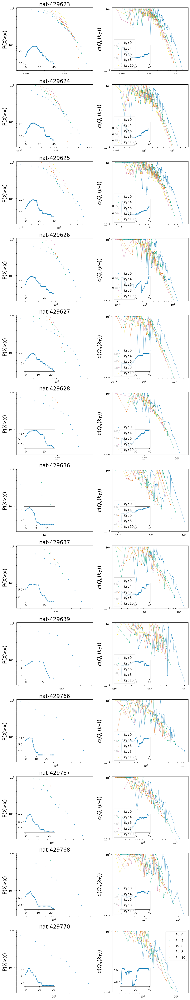

In [55]:
num_horas = len(horas_filtr_nat)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_nat)):
    plot(str(hora), "nat", hour_window_nat, arr_kt_plot_nat, umbral_nat, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

## 9n
La hora crítica 9N es: 437037

In [ ]:
hour_window_9n, arr_kt_plot_9n, umbral_9n

(2, [0, 6, 9, 12, 15, 18], 5)

  0%|          | 0/32 [00:00<?, ?it/s]

Grafo 9n:436989  (umbral 5) reducido a 5.42 % en nodos y  2.18 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35544.95it/s]


Calculating best minimal value for power law fit


  3%|▎         | 1/32 [00:04<02:27,  4.75s/it]

Grafo 9n:436991  (umbral 5) reducido a 4.95 % en nodos y  2.2 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31775.03it/s]


Calculating best minimal value for power law fit


  6%|▋         | 2/32 [00:10<02:40,  5.37s/it]

Grafo 9n:436993  (umbral 5) reducido a 9.26 % en nodos y  3.27 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23718.97it/s]


Calculating best minimal value for power law fit


  9%|▉         | 3/32 [00:25<04:37,  9.56s/it]

Grafo 9n:436995  (umbral 5) reducido a 8.7 % en nodos y  3.03 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 10123.02it/s]


Calculating best minimal value for power law fit


 12%|█▎        | 4/32 [00:28<03:23,  7.25s/it]

Grafo 9n:437003  (umbral 5) reducido a 5.83 % en nodos y  1.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 9161.20it/s]


Calculating best minimal value for power law fit


 16%|█▌        | 5/32 [00:34<02:57,  6.57s/it]

Grafo 9n:437009  (umbral 5) reducido a 5.27 % en nodos y  2.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28597.53it/s]


Calculating best minimal value for power law fit


 19%|█▉        | 6/32 [00:37<02:24,  5.54s/it]

Grafo 9n:437011  (umbral 5) reducido a 7.22 % en nodos y  2.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35595.22it/s]


Calculating best minimal value for power law fit


 22%|██▏       | 7/32 [00:44<02:29,  5.97s/it]

Grafo 9n:437013  (umbral 5) reducido a 7.73 % en nodos y  3.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 40655.61it/s]


Calculating best minimal value for power law fit


 25%|██▌       | 8/32 [00:53<02:45,  6.89s/it]

Grafo 9n:437015  (umbral 5) reducido a 10.62 % en nodos y  4.62 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 39260.26it/s]


Calculating best minimal value for power law fit


 28%|██▊       | 9/32 [01:07<03:32,  9.24s/it]

Grafo 9n:437017  (umbral 5) reducido a 9.42 % en nodos y  4.3 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28212.81it/s]


Calculating best minimal value for power law fit


 31%|███▏      | 10/32 [01:22<03:59, 10.90s/it]

Grafo 9n:437019  (umbral 5) reducido a 8.96 % en nodos y  2.78 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 24036.13it/s]


Calculating best minimal value for power law fit


 34%|███▍      | 11/32 [01:31<03:35, 10.26s/it]

Grafo 9n:437027  (umbral 5) reducido a 5.84 % en nodos y  1.09 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32017.59it/s]


Calculating best minimal value for power law fit


 38%|███▊      | 12/32 [02:56<10:59, 32.95s/it]

Grafo 9n:437029  (umbral 5) reducido a 6.21 % en nodos y  1.92 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25266.89it/s]


Calculating best minimal value for power law fit


 41%|████      | 13/32 [03:11<08:47, 27.76s/it]

Grafo 9n:437031  (umbral 5) reducido a 8.49 % en nodos y  3.46 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34663.67it/s]


Calculating best minimal value for power law fit


 44%|████▍     | 14/32 [03:24<06:56, 23.15s/it]

Grafo 9n:437033  (umbral 5) reducido a 6.83 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32682.89it/s]


Calculating best minimal value for power law fit


 47%|████▋     | 15/32 [04:02<07:47, 27.52s/it]

Grafo 9n:437035  (umbral 5) reducido a 10.72 % en nodos y  6.13 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25575.02it/s]


Calculating best minimal value for power law fit


 50%|█████     | 16/32 [04:16<06:18, 23.64s/it]

Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34711.48it/s]


Calculating best minimal value for power law fit


 53%|█████▎    | 17/32 [04:58<07:18, 29.21s/it]

Grafo 9n:437039  (umbral 5) reducido a 12.23 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23674.34it/s]


Calculating best minimal value for power law fit


 56%|█████▋    | 18/32 [05:33<07:12, 30.93s/it]

Grafo 9n:437041  (umbral 5) reducido a 13.77 % en nodos y  5.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 16163.02it/s]


Calculating best minimal value for power law fit


 59%|█████▉    | 19/32 [06:04<06:42, 31.00s/it]

Grafo 9n:437043  (umbral 5) reducido a 12.96 % en nodos y  5.08 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 26973.02it/s]


Calculating best minimal value for power law fit


 62%|██████▎   | 20/32 [06:22<05:22, 26.87s/it]

Grafo 9n:437045  (umbral 5) reducido a 11.05 % en nodos y  2.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23323.28it/s]


Calculating best minimal value for power law fit


 66%|██████▌   | 21/32 [06:30<03:55, 21.37s/it]

Grafo 9n:437051  (umbral 5) reducido a 9.88 % en nodos y  3.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38597.89it/s]


Calculating best minimal value for power law fit


 69%|██████▉   | 22/32 [06:42<03:04, 18.41s/it]

Grafo 9n:437053  (umbral 5) reducido a 8.33 % en nodos y  2.77 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31936.32it/s]


Calculating best minimal value for power law fit


 72%|███████▏  | 23/32 [06:52<02:23, 15.92s/it]

Grafo 9n:437055  (umbral 5) reducido a 5.85 % en nodos y  2.65 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 37063.07it/s]


Calculating best minimal value for power law fit


 75%|███████▌  | 24/32 [07:00<01:48, 13.57s/it]

Grafo 9n:437057  (umbral 5) reducido a 6.78 % en nodos y  3.72 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17142.93it/s]


Calculating best minimal value for power law fit


 78%|███████▊  | 25/32 [07:06<01:18, 11.28s/it]

Grafo 9n:437059  (umbral 5) reducido a 9.97 % en nodos y  4.21 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18355.82it/s]


Calculating best minimal value for power law fit


 81%|████████▏ | 26/32 [07:30<01:31, 15.22s/it]

Grafo 9n:437061  (umbral 5) reducido a 10.95 % en nodos y  5.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23944.65it/s]


Calculating best minimal value for power law fit


 84%|████████▍ | 27/32 [08:09<01:51, 22.35s/it]

Grafo 9n:437063  (umbral 5) reducido a 10.63 % en nodos y  5.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27807.54it/s]


Calculating best minimal value for power law fit


 88%|████████▊ | 28/32 [08:35<01:32, 23.25s/it]

Grafo 9n:437065  (umbral 5) reducido a 10.09 % en nodos y  2.55 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35797.76it/s]


Calculating best minimal value for power law fit


 91%|█████████ | 29/32 [10:09<02:14, 44.73s/it]

Grafo 9n:437067  (umbral 5) reducido a 10.37 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25394.37it/s]


Calculating best minimal value for power law fit


 94%|█████████▍| 30/32 [10:52<01:28, 44.18s/it]

Grafo 9n:437075  (umbral 5) reducido a 5.66 % en nodos y  0.96 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32939.56it/s]


Calculating best minimal value for power law fit


 97%|█████████▋| 31/32 [12:15<00:55, 55.61s/it]

Grafo 9n:437077  (umbral 5) reducido a 7.75 % en nodos y  3.59 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38130.04it/s]


Calculating best minimal value for power law fit


100%|██████████| 32/32 [12:21<00:00, 23.16s/it]


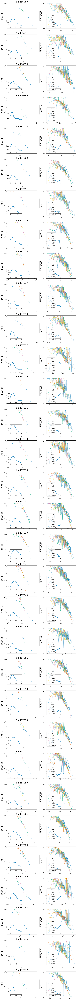

  0%|          | 0/32 [00:00<?, ?it/s]


TypeError: plot() missing 1 required positional argument: 'axs_row'

In [ ]:
num_horas = len(horas_filtr_9n)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_9n)):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

for hora in tqdm(horas_filtr_9n):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n)

  0%|          | 0/32 [00:00<?, ?it/s]

Grafo 9n:436989  (umbral 5) reducido a 5.42 % en nodos y  2.18 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23301.69it/s]


Calculating best minimal value for power law fit


 36%|███▌      | 180/500 [00:04<00:07, 44.34it/s]


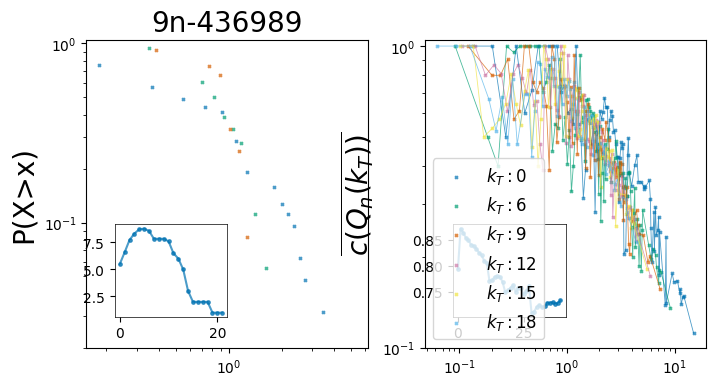

  3%|▎         | 1/32 [00:05<02:35,  5.02s/it]

Grafo 9n:436991  (umbral 5) reducido a 4.95 % en nodos y  2.2 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35848.75it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 211/500 [00:05<00:07, 38.68it/s]


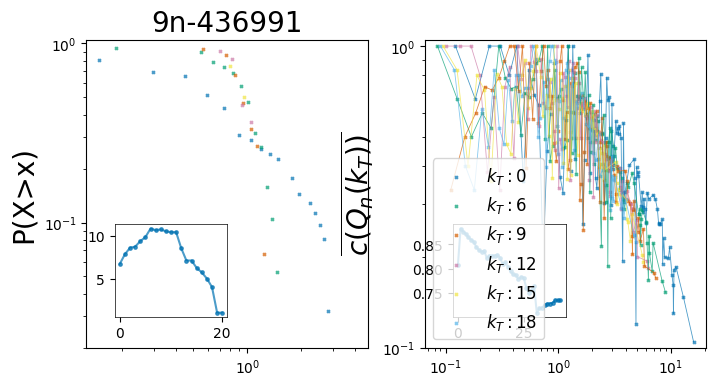

  6%|▋         | 2/32 [00:12<03:05,  6.19s/it]

Grafo 9n:436993  (umbral 5) reducido a 9.26 % en nodos y  3.27 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 21326.97it/s]


Calculating best minimal value for power law fit


 62%|██████▏   | 308/500 [00:14<00:09, 20.57it/s]


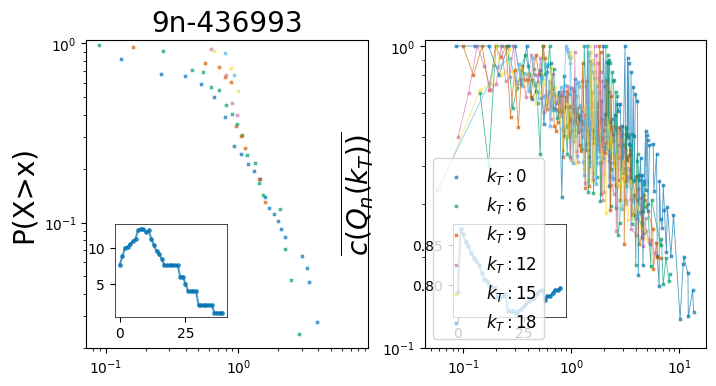

  9%|▉         | 3/32 [00:28<05:21, 11.09s/it]

Grafo 9n:436995  (umbral 5) reducido a 8.7 % en nodos y  3.03 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 11382.10it/s]


Calculating best minimal value for power law fit


 43%|████▎     | 214/500 [00:03<00:05, 56.73it/s] 


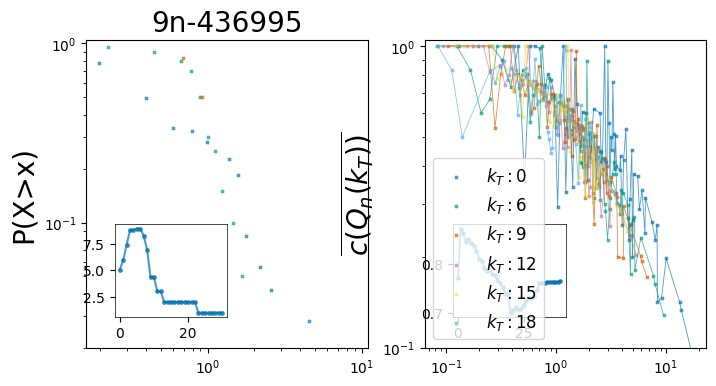

 12%|█▎        | 4/32 [00:33<04:00,  8.58s/it]

Grafo 9n:437003  (umbral 5) reducido a 5.83 % en nodos y  1.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27176.92it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 211/500 [00:04<00:06, 43.46it/s] 


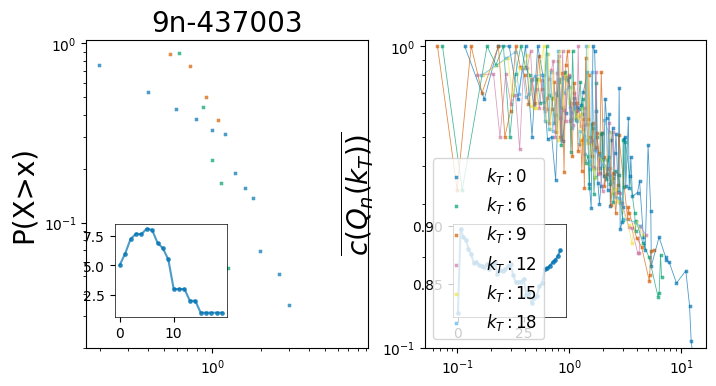

 16%|█▌        | 5/32 [00:39<03:23,  7.54s/it]

Grafo 9n:437009  (umbral 5) reducido a 5.27 % en nodos y  2.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 22114.08it/s]


Calculating best minimal value for power law fit


 39%|███▉      | 195/500 [00:03<00:05, 57.12it/s] 


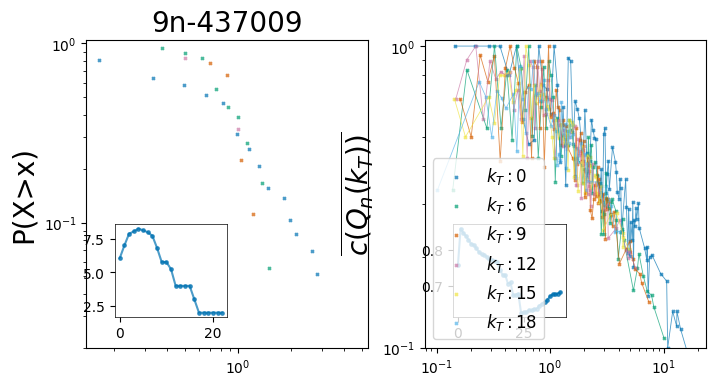

 19%|█▉        | 6/32 [00:43<02:46,  6.42s/it]

Grafo 9n:437011  (umbral 5) reducido a 7.22 % en nodos y  2.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17236.87it/s]


Calculating best minimal value for power law fit


 54%|█████▍    | 272/500 [00:06<00:05, 39.89it/s]


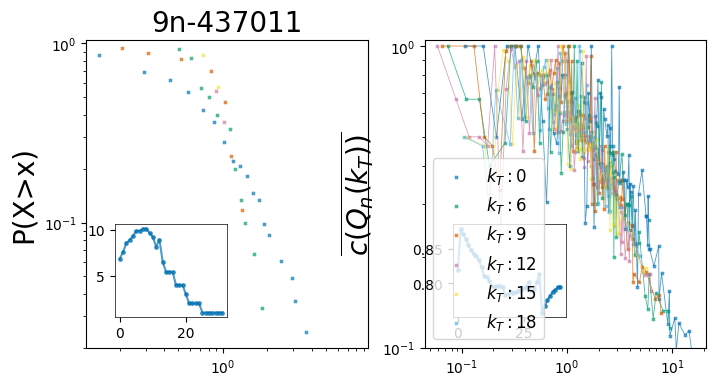

 22%|██▏       | 7/32 [00:52<02:57,  7.10s/it]

Grafo 9n:437013  (umbral 5) reducido a 7.73 % en nodos y  3.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 13981.01it/s]


Calculating best minimal value for power law fit


 63%|██████▎   | 315/500 [00:08<00:05, 36.75it/s]


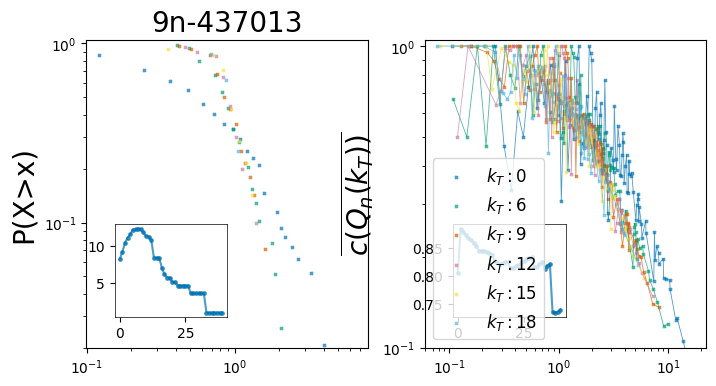

 25%|██▌       | 8/32 [01:02<03:15,  8.15s/it]

Grafo 9n:437015  (umbral 5) reducido a 10.62 % en nodos y  4.62 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27594.11it/s]


Calculating best minimal value for power law fit


 74%|███████▍  | 369/500 [00:15<00:05, 24.12it/s]


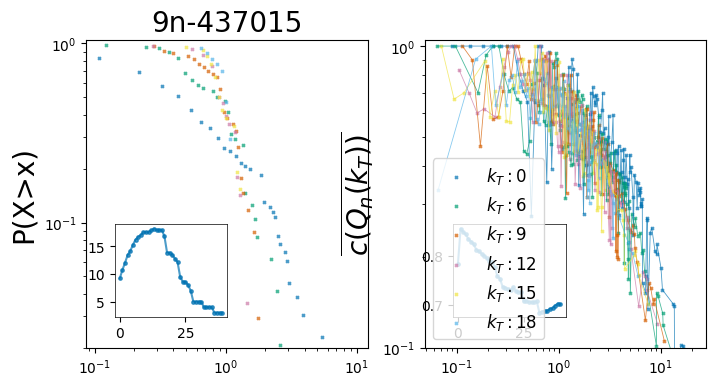

 28%|██▊       | 9/32 [01:19<04:07, 10.76s/it]

Grafo 9n:437017  (umbral 5) reducido a 9.42 % en nodos y  4.3 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27533.72it/s]


Calculating best minimal value for power law fit


 72%|███████▏  | 360/500 [00:14<00:05, 24.63it/s]


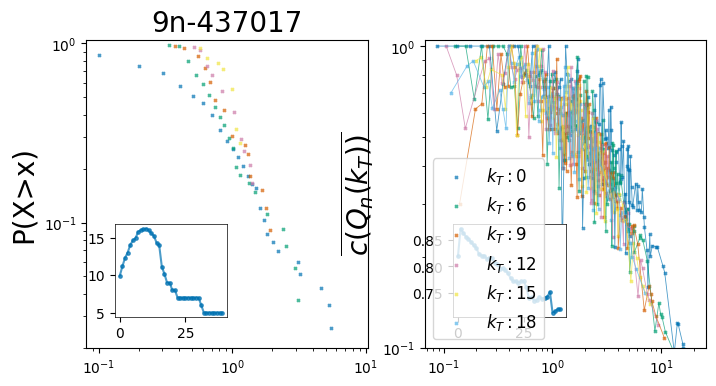

 31%|███▏      | 10/32 [01:35<04:35, 12.50s/it]

Grafo 9n:437019  (umbral 5) reducido a 8.96 % en nodos y  2.78 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28500.37it/s]


Calculating best minimal value for power law fit


 57%|█████▋    | 284/500 [00:07<00:05, 37.72it/s]


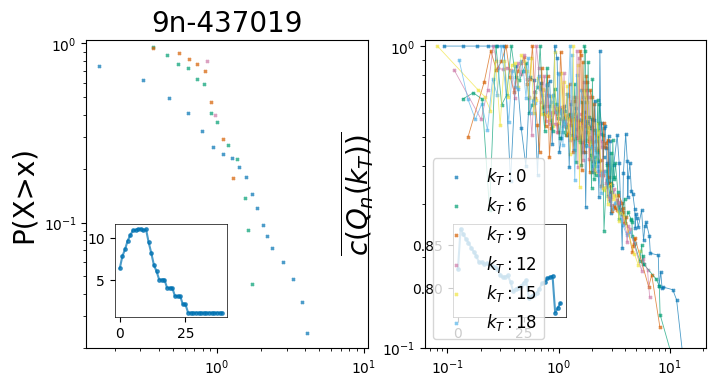

 34%|███▍      | 11/32 [01:44<04:01, 11.52s/it]

Grafo 9n:437027  (umbral 5) reducido a 5.84 % en nodos y  1.09 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18315.74it/s]


Calculating best minimal value for power law fit


 77%|███████▋  | 387/500 [01:22<00:24,  4.68it/s]


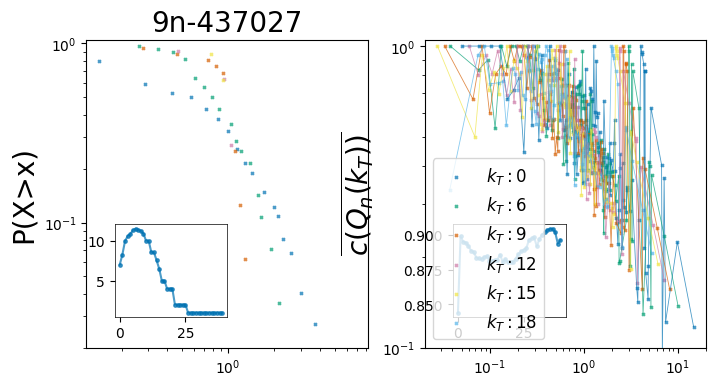

 38%|███▊      | 12/32 [03:09<11:18, 33.90s/it]

Grafo 9n:437029  (umbral 5) reducido a 6.21 % en nodos y  1.92 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18613.78it/s]


Calculating best minimal value for power law fit


 54%|█████▍    | 270/500 [00:14<00:12, 18.25it/s]


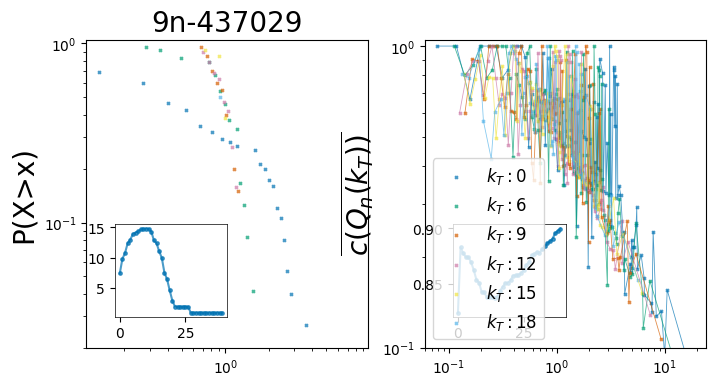

 41%|████      | 13/32 [03:26<09:05, 28.69s/it]

Grafo 9n:437031  (umbral 5) reducido a 8.49 % en nodos y  3.46 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32181.36it/s]


Calculating best minimal value for power law fit


 65%|██████▌   | 325/500 [00:12<00:06, 25.97it/s]


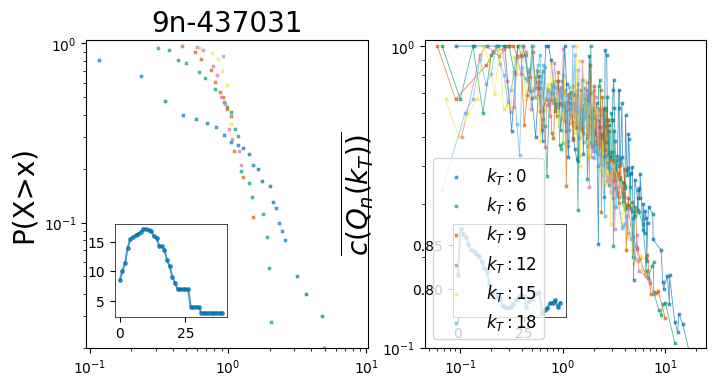

 44%|████▍     | 14/32 [03:40<07:13, 24.11s/it]

Grafo 9n:437033  (umbral 5) reducido a 6.83 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25917.43it/s]


Calculating best minimal value for power law fit


 76%|███████▋  | 382/500 [00:37<00:11, 10.31it/s]


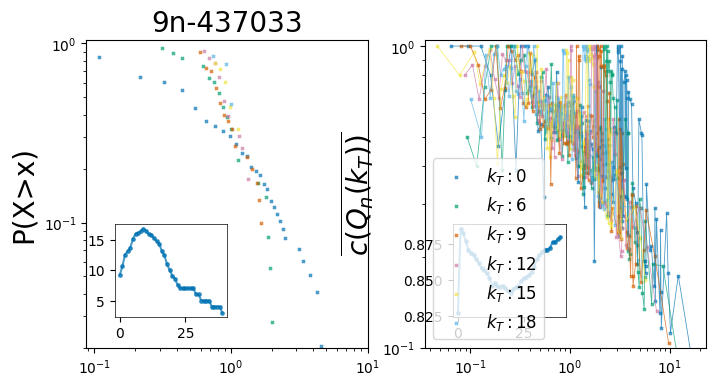

 47%|████▋     | 15/32 [04:19<08:06, 28.60s/it]

Grafo 9n:437035  (umbral 5) reducido a 10.72 % en nodos y  6.13 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23899.17it/s]


Calculating best minimal value for power law fit


 80%|███████▉  | 399/500 [00:15<00:03, 25.30it/s]


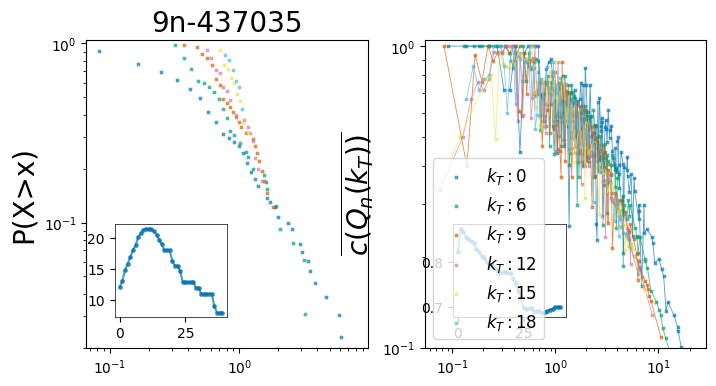

 50%|█████     | 16/32 [04:36<06:45, 25.31s/it]

Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18490.69it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:44<00:00, 11.21it/s]


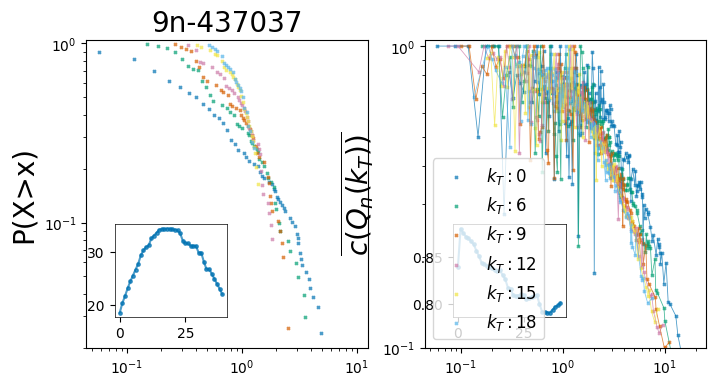

 53%|█████▎    | 17/32 [05:23<07:57, 31.82s/it]

Grafo 9n:437039  (umbral 5) reducido a 12.23 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34100.03it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:36<00:00, 13.69it/s]


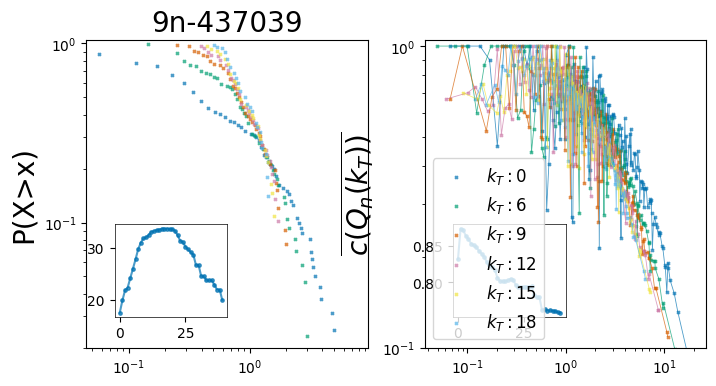

 56%|█████▋    | 18/32 [06:02<07:54, 33.87s/it]

Grafo 9n:437041  (umbral 5) reducido a 13.77 % en nodos y  5.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 22898.84it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:29<00:00, 17.24it/s]


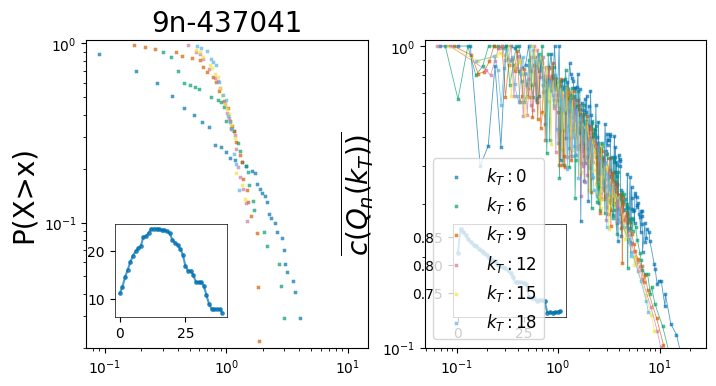

 59%|█████▉    | 19/32 [06:33<07:09, 33.02s/it]

Grafo 9n:437043  (umbral 5) reducido a 12.96 % en nodos y  5.08 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28181.21it/s]


Calculating best minimal value for power law fit


 73%|███████▎  | 364/500 [00:16<00:06, 22.07it/s]


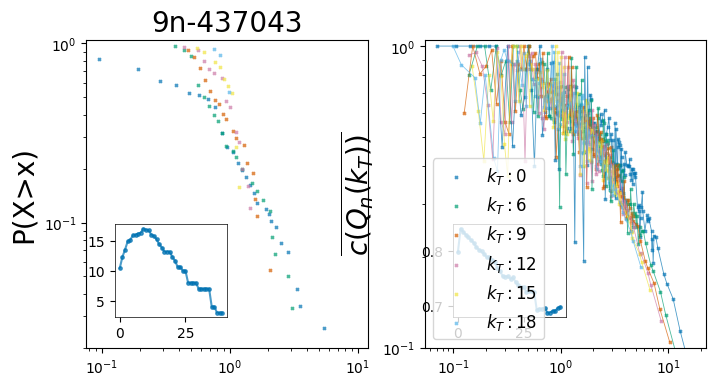

 62%|██████▎   | 20/32 [06:50<05:40, 28.35s/it]

Grafo 9n:437045  (umbral 5) reducido a 11.05 % en nodos y  2.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27563.88it/s]


Calculating best minimal value for power law fit


 49%|████▉     | 246/500 [00:08<00:08, 30.55it/s]


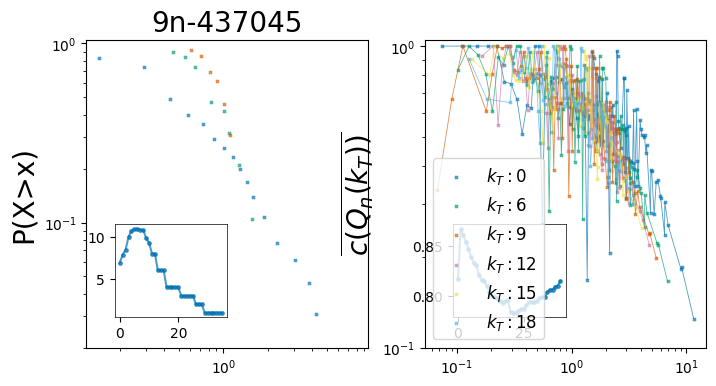

 66%|██████▌   | 21/32 [06:59<04:07, 22.51s/it]

Grafo 9n:437051  (umbral 5) reducido a 9.88 % en nodos y  3.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33779.63it/s]


Calculating best minimal value for power law fit


 52%|█████▏    | 262/500 [00:09<00:08, 28.17it/s]


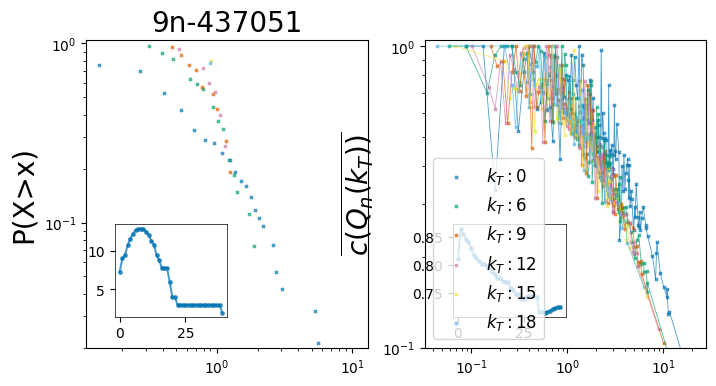

 69%|██████▉   | 22/32 [07:10<03:10, 19.04s/it]

Grafo 9n:437053  (umbral 5) reducido a 8.33 % en nodos y  2.77 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 20327.81it/s]


Calculating best minimal value for power law fit


 55%|█████▌    | 277/500 [00:07<00:05, 38.53it/s]


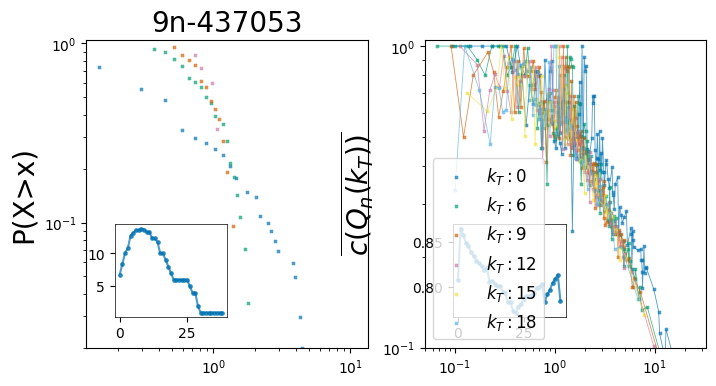

 72%|███████▏  | 23/32 [07:19<02:23, 15.95s/it]

Grafo 9n:437055  (umbral 5) reducido a 5.85 % en nodos y  2.65 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 43539.49it/s]


Calculating best minimal value for power law fit


 48%|████▊     | 242/500 [00:04<00:05, 48.66it/s] 


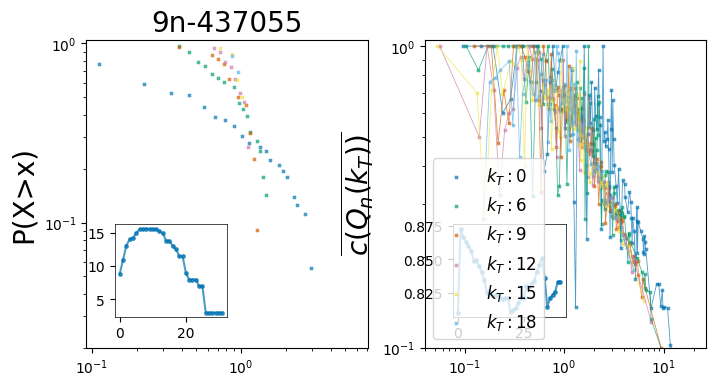

 75%|███████▌  | 24/32 [07:25<01:43, 12.97s/it]

Grafo 9n:437057  (umbral 5) reducido a 6.78 % en nodos y  3.72 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 44938.97it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 208/500 [00:03<00:05, 54.61it/s] 


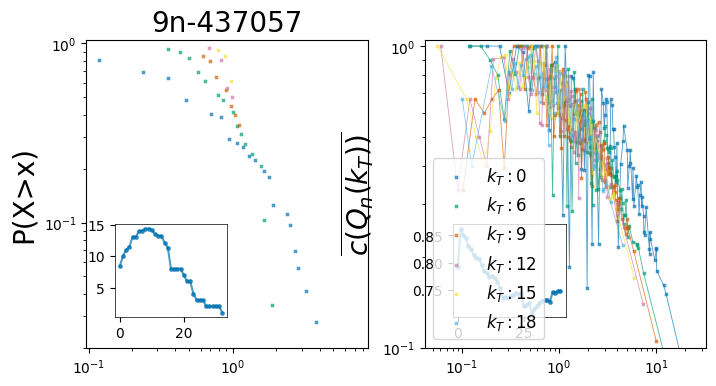

 78%|███████▊  | 25/32 [07:29<01:12, 10.37s/it]

Grafo 9n:437059  (umbral 5) reducido a 9.97 % en nodos y  4.21 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17355.74it/s]


Calculating best minimal value for power law fit


 82%|████████▏ | 411/500 [00:13<00:02, 31.17it/s]


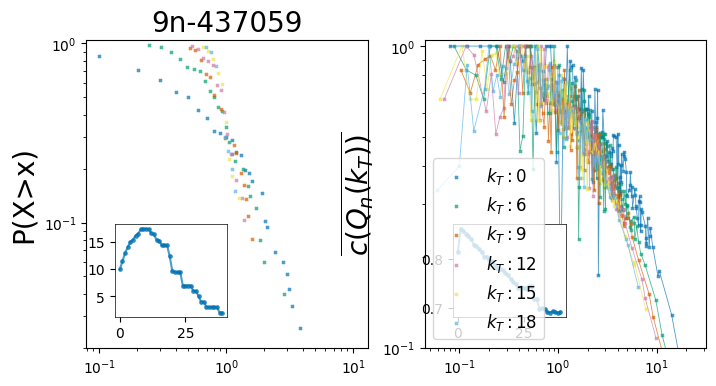

 81%|████████▏ | 26/32 [07:43<01:09, 11.54s/it]

Grafo 9n:437061  (umbral 5) reducido a 10.95 % en nodos y  5.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 24793.92it/s]

Calculating best minimal value for power law fit



100%|██████████| 500/500 [00:22<00:00, 22.08it/s]


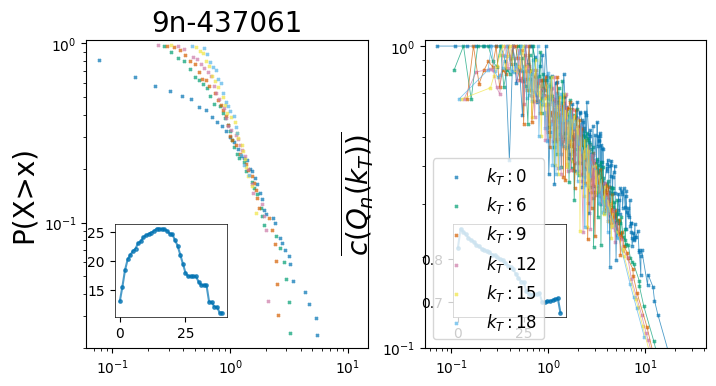

 84%|████████▍ | 27/32 [08:07<01:16, 15.25s/it]

Grafo 9n:437063  (umbral 5) reducido a 10.63 % en nodos y  5.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 39444.87it/s]


Calculating best minimal value for power law fit


 74%|███████▍  | 369/500 [00:14<00:05, 25.07it/s]


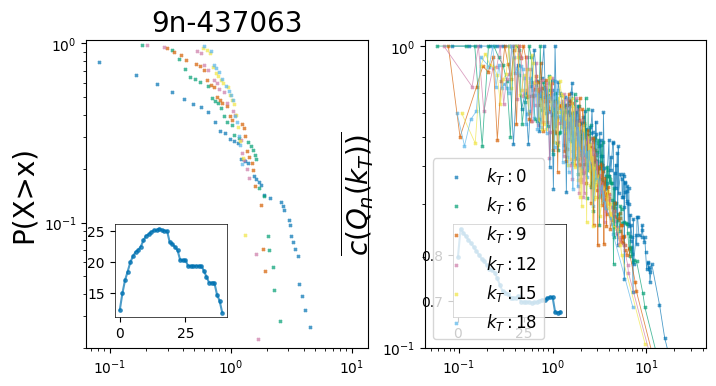

 88%|████████▊ | 28/32 [08:23<01:01, 15.47s/it]

Grafo 9n:437065  (umbral 5) reducido a 10.09 % en nodos y  2.55 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 42438.15it/s]


Calculating best minimal value for power law fit


 97%|█████████▋| 487/500 [00:49<00:01,  9.83it/s]


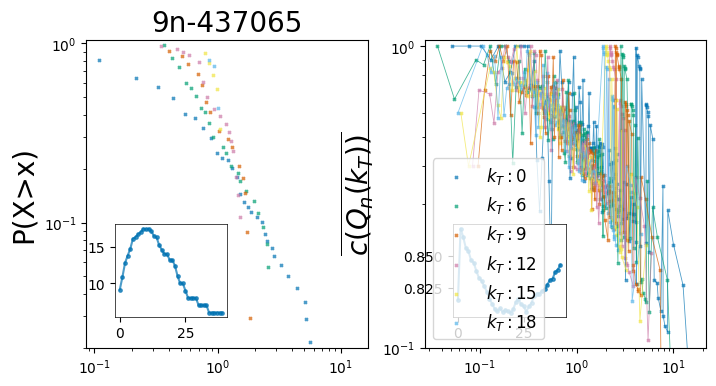

 91%|█████████ | 29/32 [09:15<01:18, 26.25s/it]

Grafo 9n:437067  (umbral 5) reducido a 10.37 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38597.89it/s]


Calculating best minimal value for power law fit


 78%|███████▊  | 388/500 [00:22<00:06, 17.17it/s]


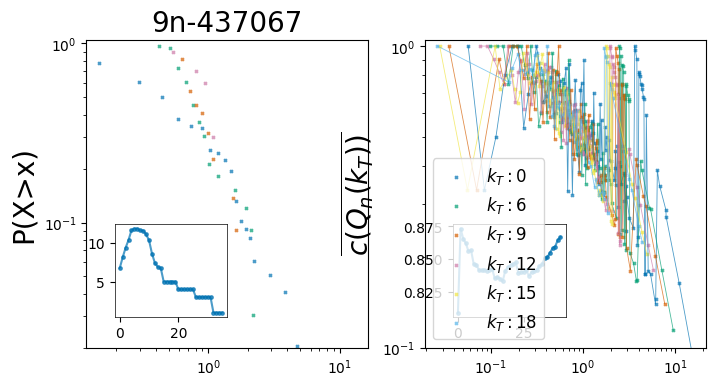

 94%|█████████▍| 30/32 [09:38<00:50, 25.48s/it]

Grafo 9n:437075  (umbral 5) reducido a 5.66 % en nodos y  0.96 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 43389.35it/s]


Calculating best minimal value for power law fit


 90%|████████▉ | 449/500 [00:46<00:05,  9.67it/s]


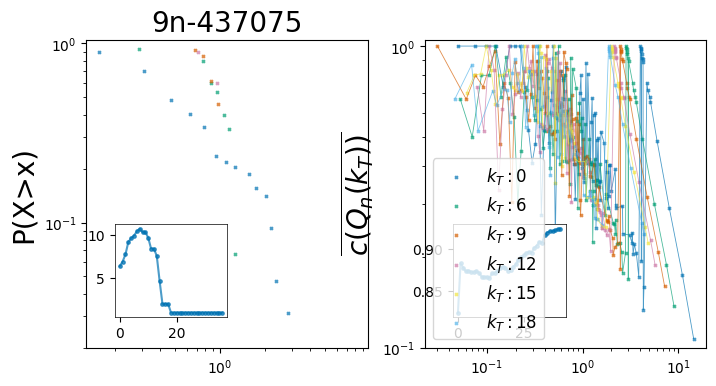

 97%|█████████▋| 31/32 [10:26<00:31, 31.99s/it]

Grafo 9n:437077  (umbral 5) reducido a 7.75 % en nodos y  3.59 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 45839.39it/s]


Calculating best minimal value for power law fit


 58%|█████▊    | 291/500 [00:03<00:02, 91.09it/s] 


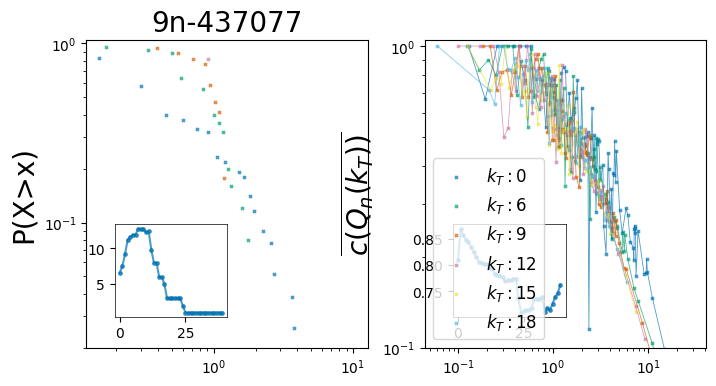

100%|██████████| 32/32 [10:30<00:00, 19.70s/it]


In [ ]:
for hora in tqdm(horas_filtr_9n):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n)

## CH
La hora crítica CH es: 394717

In [ ]:
hour_window_ch, arr_kt_plot_ch, umbral_ch

(2, [0, 1, 2, 3, 4, 5], 3)

  0%|          | 0/16 [00:00<?, ?it/s]

Grafo ch:394619  (umbral 3) reducido a 8.56 % en nodos y  4.98 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38187.90it/s]


Calculating best minimal value for power law fit


  6%|▋         | 1/16 [00:00<00:04,  3.26it/s]

Grafo ch:394621  (umbral 3) reducido a 10.33 % en nodos y  6.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 40394.58it/s]


Calculating best minimal value for power law fit


 12%|█▎        | 2/16 [00:00<00:07,  1.92it/s]

Grafo ch:394623  (umbral 3) reducido a 9.01 % en nodos y  4.99 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38130.04it/s]


Calculating best minimal value for power law fit


 19%|█▉        | 3/16 [00:02<00:10,  1.30it/s]

Grafo ch:394625  (umbral 3) reducido a 14.06 % en nodos y  8.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 29852.70it/s]


Calculating best minimal value for power law fit


 25%|██▌       | 4/16 [00:03<00:14,  1.19s/it]

Grafo ch:394627  (umbral 3) reducido a 11.62 % en nodos y  7.97 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 36157.79it/s]


Calculating best minimal value for power law fit


 31%|███▏      | 5/16 [00:06<00:19,  1.73s/it]

Grafo ch:394629  (umbral 3) reducido a 10.06 % en nodos y  6.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32513.98it/s]


Calculating best minimal value for power law fit


 38%|███▊      | 6/16 [00:09<00:19,  1.98s/it]

Grafo ch:394643  (umbral 3) reducido a 8.79 % en nodos y  6.14 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 26159.90it/s]


Calculating best minimal value for power law fit


 44%|████▍     | 7/16 [00:09<00:14,  1.58s/it]

Grafo ch:394649  (umbral 3) reducido a 8.52 % en nodos y  5.4 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 13873.11it/s]


Calculating best minimal value for power law fit


 50%|█████     | 8/16 [00:10<00:10,  1.32s/it]

Grafo ch:394653  (umbral 3) reducido a 6.55 % en nodos y  2.5 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 12300.01it/s]


Calculating best minimal value for power law fit


 56%|█████▋    | 9/16 [00:12<00:09,  1.41s/it]

Grafo ch:394671  (umbral 3) reducido a 9.23 % en nodos y  9.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33200.30it/s]


Calculating best minimal value for power law fit


 62%|██████▎   | 10/16 [00:13<00:08,  1.33s/it]

Grafo ch:394673  (umbral 3) reducido a 9.47 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 29059.84it/s]


Calculating best minimal value for power law fit


 69%|██████▉   | 11/16 [00:14<00:07,  1.41s/it]

Grafo ch:394715  (umbral 3) reducido a 8.19 % en nodos y  6.97 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25497.29it/s]


Calculating best minimal value for power law fit


 75%|███████▌  | 12/16 [00:15<00:04,  1.16s/it]

Grafo ch:394717  (umbral 3) reducido a 13.31 % en nodos y  7.4 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31615.36it/s]


Calculating best minimal value for power law fit


 81%|████████▏ | 13/16 [00:17<00:04,  1.50s/it]

Grafo ch:394719  (umbral 3) reducido a 12.63 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 16163.02it/s]


Calculating best minimal value for power law fit


 88%|████████▊ | 14/16 [00:20<00:03,  1.73s/it]

Grafo ch:394721  (umbral 3) reducido a 11.67 % en nodos y  7.84 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33112.93it/s]


Calculating best minimal value for power law fit


 94%|█████████▍| 15/16 [00:21<00:01,  1.62s/it]

Grafo ch:394723  (umbral 3) reducido a 5.97 % en nodos y  4.25 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 20936.63it/s]


Calculating best minimal value for power law fit


100%|██████████| 16/16 [00:22<00:00,  1.41s/it]


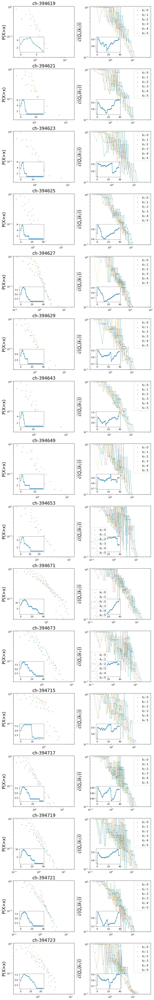

In [ ]:
num_horas = len(horas_filtr_ch)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_ch)):
    plot(str(hora), "ch", hour_window_ch, arr_kt_plot_ch, umbral_ch, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()